## Plankton food web grazing fluxes between cold and warm periods 

In [1]:
%matplotlib inline
import warnings
warnings.simplefilter("ignore") # Silence warnings
import hvplot.xarray
import xarray as xr
import glob
import pandas as pd
import numpy as np
import os
from pySankey.sankey import sankey
import matplotlib.pyplot as plt

In [2]:
import re
numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

In [3]:
graze_ds_inter = np.load("/glade/scratch/gabyn/SPECTRA/graze_ds_inter.npy")

In [4]:
graze_ds_inter.shape

(36, 63, 12, 15, 180, 360)

In [597]:
region = input("What is the region?") 

What is the region? ao


ao = [170:180,:]
cs = [149:170,0:25]
bs = [149:170,25:55]
ca = [149:170,55:110]
bb = [149:170,110:135]
ess = [149:170,325:360]
ls = [149:170,270:325]
ns = [149:170,155:205]
bts = [149:170,205:233]
ks [149:170,233:270]
AO = [149:180,:]

* ao_lat = np.arange(170,180,1)
* cs_lon = np.arange(0,25,1)
* bs_lon = np.arange(25,55,1)
* ca_lon = np.arange(55,110,1)
* bb_lon = np.arange(110,135,1)
* ess_lon = np.arange(325,360,1)
* ls_lon = np.arange(270,325,1)
* ns_lon = np.arange(155,205,1)
* bts_lon = np.arange(205,233,1)
* ks_lon = np.arange(233,270,1)

## This graze_ds_inter axis 0 corresponds to: 
## Stack all of these values together, for grazing and for loss. 
- diaz_zoo1_ds.graze_diaz_zoo1
- diaz_zoo2_ds.graze_diaz_zoo2
- diaz_zoo3_ds.graze_diaz_zoo3
- pp_zoo1_ds.graze_pp_zoo1
- mp1_zoo1_ds.graze_mp1_zoo1
- mp1_zoo2_ds.graze_mp1_zoo2
- mp2_zoo2_ds.graze_mp2_zoo2
- mp2_zoo3_ds.graze_mp2_zoo3
- mp2_zoo4_ds.graze_mp2_zoo4
- mp3_zoo3_ds.graze_mp3_zoo3
- mp3_zoo4_ds.graze_mp3_zoo4
- mp3_zoo5_ds.graze_mp3_zoo5
- mp4_zoo4_ds.graze_mp4_zoo4
- mp4_zoo5_ds.graze_mp4_zoo5
- mp4_zoo6_ds.graze_mp4_zoo6
- diat1_zoo1_ds.graze_diat1_zoo1
- diat1_zoo2_ds.graze_diat1_zoo2
- diat1_zoo3_ds.graze_diat1_zoo3
- diat1_zoo4_ds.graze_diat1_zoo4
- diat2_zoo2_ds.graze_diat2_zoo2
- diat2_zoo3_ds.graze_diat2_zoo3
- diat2_zoo4_ds.graze_diat2_zoo4
- diat2_zoo5_ds.graze_diat2_zoo5
- diat3_zoo3_ds.graze_diat3_zoo6,
- diat3_zoo4_ds.graze_diat3_zoo4
- diat3_zoo5_ds.graze_diat3_zoo5
- diat3_zoo6_ds.graze_diat3_zoo6
- zoo1_zoo2_ds.graze_zoo1_zoo2
- zoo1_zoo3_ds.graze_zoo1_zoo3
- zoo2_zoo3_ds.graze_zoo2_zoo3
- zoo2_zoo4_ds.graze_zoo2_zoo4
- zoo3_zoo4_ds.graze_zoo3_zoo4
- zoo3_zoo5_ds.graze_zoo3_zoo5
- zoo4_zoo5_ds.graze_zoo4_zoo5
- zoo4_zoo6_ds.graze_zoo4_zoo6
- zoo5_zoo6_ds.graze_zoo5_zoo6

## Import warm and cold years

In [598]:
temp_inds = sorted(glob.glob('/glade/scratch/gabyn/SPECTRA/GNG595_monthly_yearly_1948_2009/regrid_SPECTRA_TEMP*.nc', recursive=True))
ds= xr.open_mfdataset(temp_inds,concat_dim='time', combine='nested') # Full 62 years of second cycle

In [599]:
temp_ds_inter = np.empty([63,12,180,360])
temp_ds_inter[:] = np.nan
x = np.array(range(0,756,12)) ## this loops from 0 to 2016, and selects every 12th number. 
for i in range(63):
    temp_ds_inter[i,:,:,:] = ds.TEMP[x[i]:x[i]+12,0,:,:]

In [600]:
temp_arctic = np.nanmean(temp_ds_inter[:,:,170:180,:], axis=(2,3))
temp_arctic_anom = temp_arctic-np.nanmean(temp_arctic,axis=0)
err_ao = np.nanstd(temp_arctic_anom,axis=(0,1))

# Selecting the warm and cold years as less or more than 1/3 of standard deviation 
cold_years_arctic = np.where(np.nanmean(temp_arctic_anom,axis=1) < -(err_ao/2))
warm_years_arctic = np.where(np.nanmean(temp_arctic_anom,axis=1) > (err_ao/2))

## Create dataframe

In [601]:
## Gaby's Path 
jluo_path = '/glade/u/home/jluo/cesm_scripts/size_structured/nl_input/cases/g.e21.G1850ECOIAF.t62_g17.marbl0_33.'
gabyn_path = '/glade/u/home/gabyn/case_notes/spectral_cases/g.e21.G1850ECOIAF.t62_g17.marbl0_33.'
nl_config = os.path.join(''+gabyn_path+'GNG595/data/')
sizes = pd.read_csv(nl_config+'plankton_sizes.csv')
sizes = sizes.sort_values('mmolC')
sizes

,type,sname,mass_ugC,vol_um3,ESD_mm,Qp_fixed,mmolC
1,phyto,pp,9.266989e-08,3.706795e-01,0.000891,0.004651,7.715418e-12
2,phyto,mp1,8.241979e-06,1.805089e+01,0.003255,0.006824,6.862025e-10
0,phyto,diaz,5.499929e-05,1.227865e+02,0.006167,0.003333,4.579077e-09
3,phyto,mp2,8.888712e-05,8.790197e+02,0.011885,0.008656,7.400476e-09
6,phyto,diat1,5.004513e-04,1.327390e+04,0.029376,0.010289,4.166608e-08
9,zoo,zoo1,2.803686e-03,2.355042e+04,0.035563,0.008547,2.334265e-07
7,phyto,diat2,3.803133e-03,1.326626e+05,0.063278,0.012602,3.166375e-07
4,phyto,mp3,4.830334e-03,4.280541e+04,0.043401,0.012907,4.021592e-07
8,phyto,diat3,2.890156e-02,1.325863e+06,0.136301,0.015435,2.406258e-06
10,zoo,zoo2,8.933984e-02,7.447577e+05,0.112462,0.008547,7.438168e-06


In [602]:
newNCDFfiles = sorted(glob.glob('/glade/scratch/gabyn/SPECTRA/GNG595_2ndcycle_20year_clim/clim_20yr_GNG595_*', recursive=True),
                      key=numericalSort)

## create a dataframe with the data. 
ds_01 = xr.open_mfdataset(newNCDFfiles,combine='by_coords')

In [603]:
prey_varnames = {}
for i,v in enumerate(sizes.sname):
    prey_varnames[v]=i

In [604]:
pred_varnames = {'zoo1':0,'zoo2':1,'zoo3':2,'zoo4':3,'zoo5':4,'zoo6':5}
grazing_vars = [v for v in ds_01 if 'graze' in v and 'zint' not in v]

In [605]:
graze_split = [v.split('_',3) for v in grazing_vars]
graze_split = pd.DataFrame(graze_split)
graze_split = graze_split.rename({0:'var',1:'prey',2:'pred'}, axis=1)
graze_split['var'] = grazing_vars

In [606]:
grazing_vars
graze_split.head(5)

,var,prey,pred
0,graze_diaz_zoo1,diaz,zoo1
1,graze_diaz_zoo2,diaz,zoo2
2,graze_diaz_zoo3,diaz,zoo3
3,graze_pp_zoo1,pp,zoo1
4,graze_mp1_zoo1,mp1,zoo1


In [607]:
graze_split['prey_ind']=np.nan # add column for the prey idex 
graze_split['pred_ind']=np.nan # add column for the predator idex 
graze_split['val']=np.nan # add column for the grazing value of the predator prey 
graze_split['prop']=np.nan # proportion in each season compared to the annual flux

In [608]:
graze_split['jan']=np.nan
graze_split['feb']=np.nan
graze_split['mar']=np.nan
graze_split['apr']=np.nan
graze_split['may']=np.nan
graze_split['jun']=np.nan
graze_split['jul']=np.nan
graze_split['aug']=np.nan
graze_split['sep']=np.nan
graze_split['oct']=np.nan
graze_split['nov']=np.nan
graze_split['dec']=np.nan

In [609]:
graze_split.head(5)

,var,prey,pred,prey_ind,pred_ind,val,prop,jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec
0,graze_diaz_zoo1,diaz,zoo1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,graze_diaz_zoo2,diaz,zoo2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,graze_diaz_zoo3,diaz,zoo3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,graze_pp_zoo1,pp,zoo1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,graze_mp1_zoo1,mp1,zoo1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [610]:
graze_split_cold = np.array(graze_split) 
graze_split_warm = np.array(graze_split) 

In [611]:
cold_years = graze_ds_inter[:,cold_years_arctic,:,:,170:180,:]

In [612]:
warm_years = graze_ds_inter[:,warm_years_arctic,:,:,170:180,:]

In [613]:
cold_yrs = np.nanmean(cold_years,axis=(1,2))
warm_yrs = np.nanmean(warm_years,axis=(1,2))

In [614]:
graze_cold = np.sum(cold_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [615]:
graze_warm = np.sum(warm_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [616]:
# Monthly Cold years
for i in range(len(graze_split.index)):
    graze_split_cold[i,3] = prey_varnames[graze_split_cold[i,1]] # populate index of prey in array 
    graze_split_cold[i,4] = pred_varnames[graze_split_cold[i,2]] # populate idex of predator in array 
    graze_split_cold[i,5] = np.nansum(graze_cold[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_cold[i,6] = (np.nansum(graze_cold[i,:,:,:]) / np.nansum(graze_cold))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_cold[i,7] = (np.nansum(graze_cold[i,0,:,:]) / np.nansum(graze_cold[:,0,:,:]))*100 # Jan
    graze_split_cold[i,8] = (np.nansum(graze_cold[i,1,:,:]) / np.nansum(graze_cold[:,1,:,:]))*100 # Feb
    graze_split_cold[i,9] = (np.nansum(graze_cold[i,2,:,:]) / np.nansum(graze_cold[:,2,:,:]))*100 # Mar
    graze_split_cold[i,10] = (np.nansum(graze_cold[i,3,:,:]) / np.nansum(graze_cold[:,3,:,:]))*100 # Apr
    graze_split_cold[i,11] = (np.nansum(graze_cold[i,4,:,:]) / np.nansum(graze_cold[:,4,:,:]))*100 # May
    graze_split_cold[i,12] = (np.nansum(graze_cold[i,5,:,:]) / np.nansum(graze_cold[:,5,:,:]))*100 # Jun
    graze_split_cold[i,13] = (np.nansum(graze_cold[i,6,:,:]) / np.nansum(graze_cold[:,6,:,:]))*100 # Jul
    graze_split_cold[i,14] = (np.nansum(graze_cold[i,7,:,:]) / np.nansum(graze_cold[:,7,:,:]))*100 # Aug
    graze_split_cold[i,15] = (np.nansum(graze_cold[i,8,:,:]) / np.nansum(graze_cold[:,8,:,:]))*100 # Sep
    graze_split_cold[i,16] = (np.nansum(graze_cold[i,9,:,:]) / np.nansum(graze_cold[:,9,:,:]))*100 # Oct
    graze_split_cold[i,17] = (np.nansum(graze_cold[i,10,:,:]) / np.nansum(graze_cold[:,10,:,:]))*100 # Nov
    graze_split_cold[i,18] = (np.nansum(graze_cold[i,11,:,:]) / np.nansum(graze_cold[:,11,:,:]))*100 # Dec
        
    
df_graze_cold = pd.DataFrame(np.array(graze_split_cold),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

In [617]:
# Annual warm years
for i in range(len(graze_split.index)):
    graze_split_warm[i,3] = prey_varnames[graze_split_warm[i,1]] # populate index of prey in array 
    graze_split_warm[i,4] = pred_varnames[graze_split_warm[i,2]] # populate idex of predator in array 
    graze_split_warm[i,5] = np.nansum(graze_warm[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_warm[i,6] = (np.nansum(graze_warm[i,:,:,:]) / np.nansum(graze_warm))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_warm[i,7] = (np.nansum(graze_warm[i,0,:,:]) / np.nansum(graze_warm[:,0,:,:]))*100 # Jan
    graze_split_warm[i,8] = (np.nansum(graze_warm[i,1,:,:]) / np.nansum(graze_warm[:,1,:,:]))*100 # Feb
    graze_split_warm[i,9] = (np.nansum(graze_warm[i,2,:,:]) / np.nansum(graze_warm[:,2,:,:]))*100 # Mar
    graze_split_warm[i,10] = (np.nansum(graze_warm[i,3,:,:]) / np.nansum(graze_warm[:,3,:,:]))*100 # Apr
    graze_split_warm[i,11] = (np.nansum(graze_warm[i,4,:,:]) / np.nansum(graze_warm[:,4,:,:]))*100 # May
    graze_split_warm[i,12] = (np.nansum(graze_warm[i,5,:,:]) / np.nansum(graze_warm[:,5,:,:]))*100 # Jun
    graze_split_warm[i,13] = (np.nansum(graze_warm[i,6,:,:]) / np.nansum(graze_warm[:,6,:,:]))*100 # Jul
    graze_split_warm[i,14] = (np.nansum(graze_warm[i,7,:,:]) / np.nansum(graze_warm[:,7,:,:]))*100 # Aug
    graze_split_warm[i,15] = (np.nansum(graze_warm[i,8,:,:]) / np.nansum(graze_warm[:,8,:,:]))*100 # Sep
    graze_split_warm[i,16] = (np.nansum(graze_warm[i,9,:,:]) / np.nansum(graze_warm[:,9,:,:]))*100 # Oct
    graze_split_warm[i,17] = (np.nansum(graze_warm[i,10,:,:]) / np.nansum(graze_warm[:,10,:,:]))*100 # Nov
    graze_split_warm[i,18] = (np.nansum(graze_warm[i,11,:,:]) / np.nansum(graze_warm[:,11,:,:]))*100 # De
    
df_graze_warm = pd.DataFrame(np.array(graze_split_warm),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

In [618]:
colors = {
    "pp": "#86daf4",
    "diaz": "#60baf7",
    "mp1": "#2d80a4",
    "diat1": "#000140",
    "mp2": "#2d80a4",
    "diat2": "#000140",
    "mp3": "#2d80a4",
    "diat3": "#000140",
    "mp4": "#2d80a4",
    "zoo1": "#FCD19E",
    "zoo2": "#FCD19E",
    "zoo3": "#DE7C08",
    "zoo4": "#DE7C08",
    "zoo5": "#DE7C08",
    "zoo6": "#DE7C08",
}

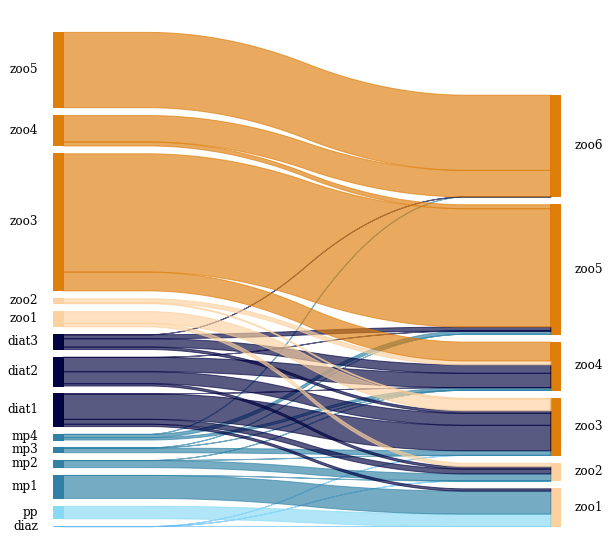

In [619]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["jan"], rightWeight=df_graze_cold["jan"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_01_"+region+".png", bbox_inches="tight", dpi=200)


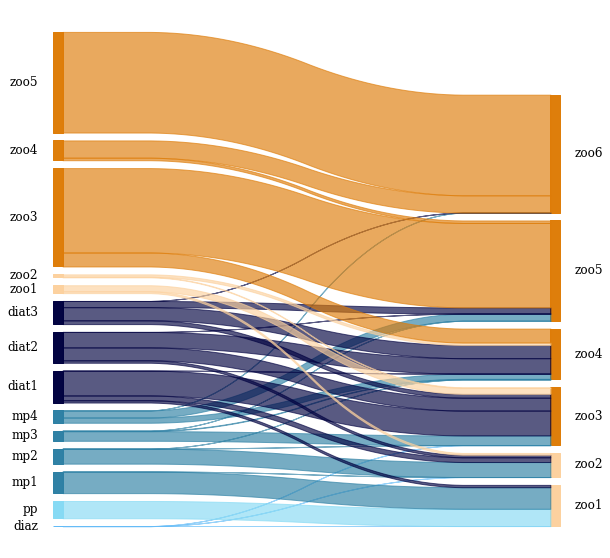

In [620]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["feb"], rightWeight=df_graze_cold["feb"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_02_"+region+".png", bbox_inches="tight", dpi=200)

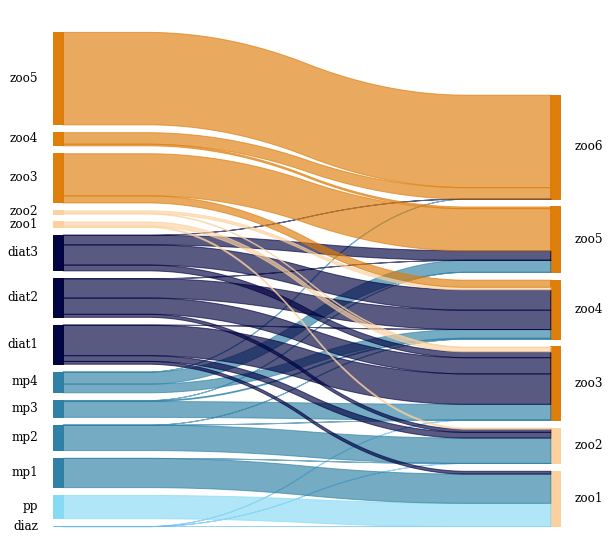

In [621]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["mar"], rightWeight=df_graze_cold["mar"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_03_"+region+".png", bbox_inches="tight", dpi=200)

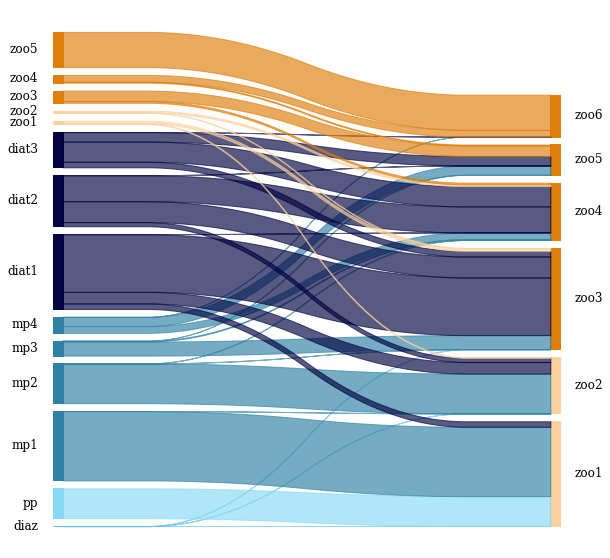

In [622]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["apr"], rightWeight=df_graze_cold["apr"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_04_"+region+".png", bbox_inches="tight", dpi=200)

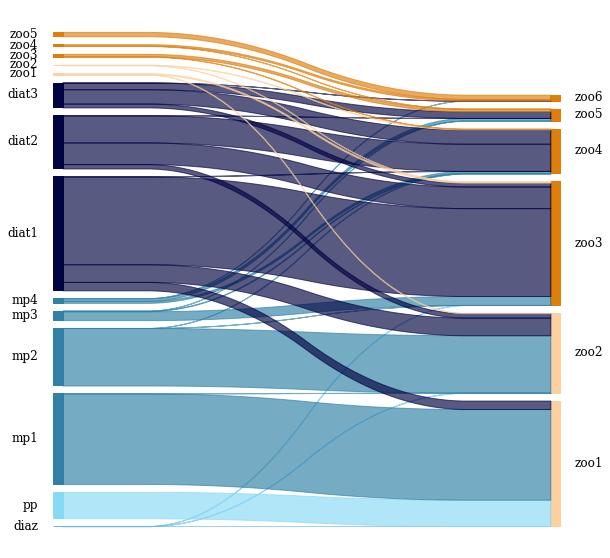

In [623]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["may"], rightWeight=df_graze_cold["may"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_05_"+region+".png", bbox_inches="tight", dpi=200)

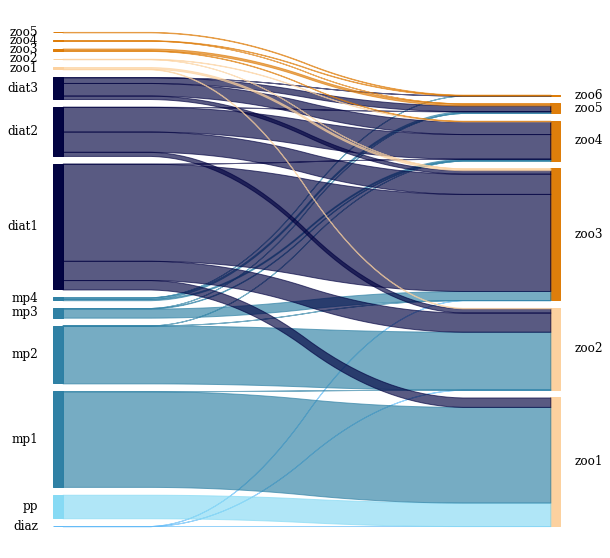

In [624]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["jun"], rightWeight=df_graze_cold["jun"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_06_"+region+".png", bbox_inches="tight", dpi=200)

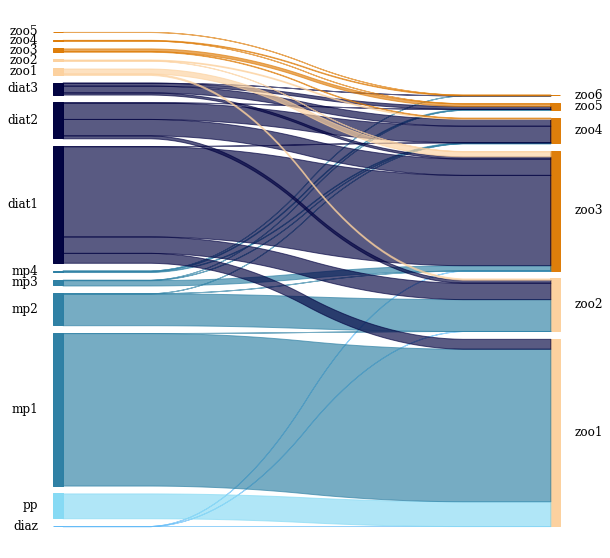

In [625]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["jul"], rightWeight=df_graze_cold["jul"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_07_"+region+".png", bbox_inches="tight", dpi=200)

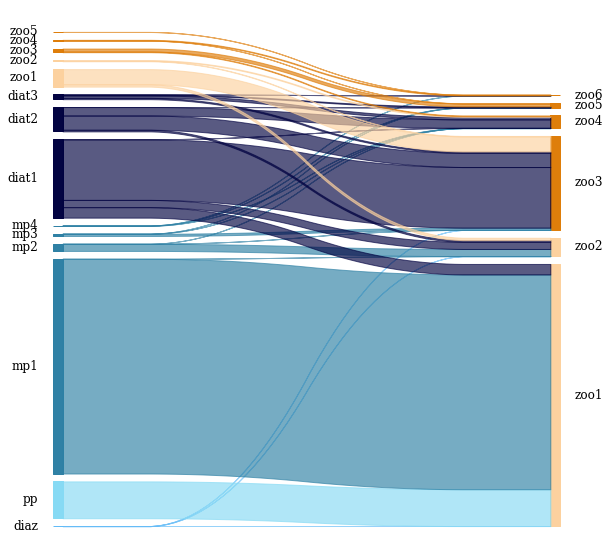

In [626]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["aug"], rightWeight=df_graze_cold["aug"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_08_"+region+".png", bbox_inches="tight", dpi=200)

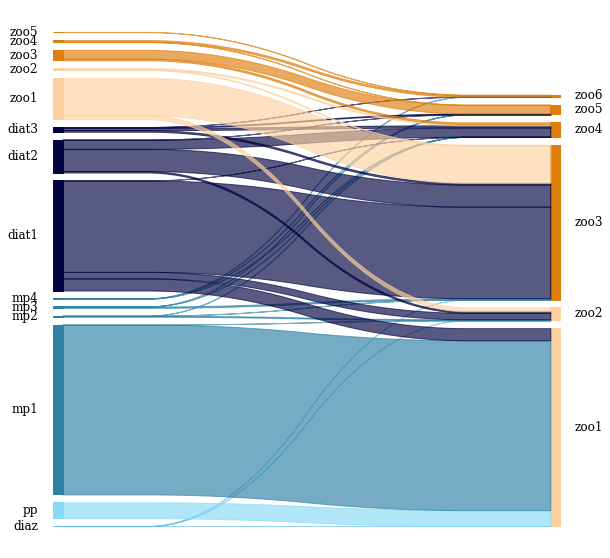

In [627]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["sep"], rightWeight=df_graze_cold["sep"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_09_"+region+".png", bbox_inches="tight", dpi=200)

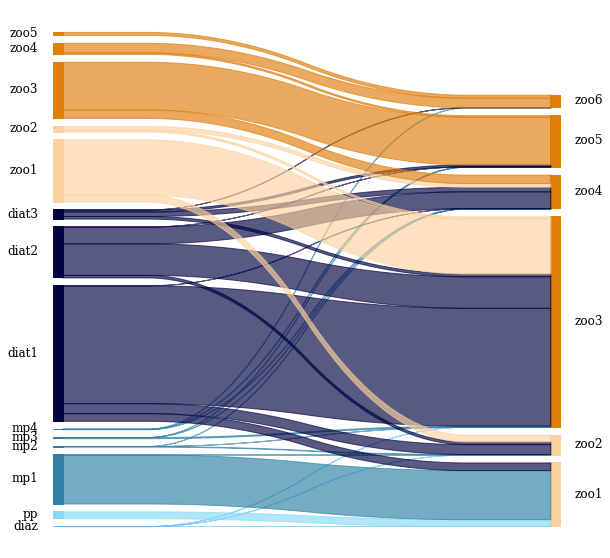

In [628]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["oct"], rightWeight=df_graze_cold["oct"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_10_"+region+".png", bbox_inches="tight", dpi=200)

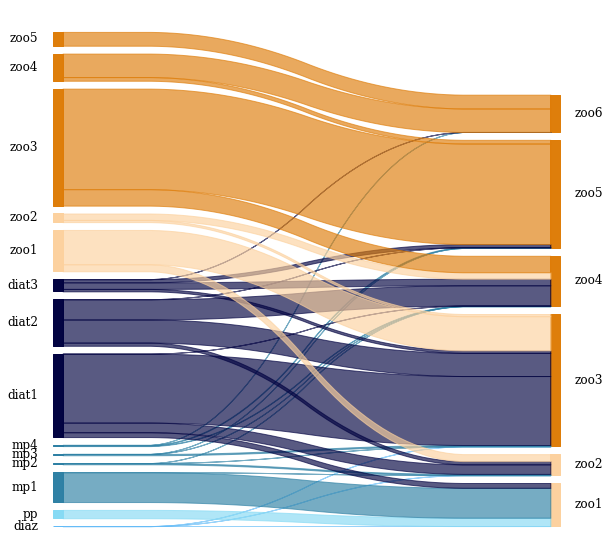

In [629]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["nov"], rightWeight=df_graze_cold["nov"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_11_"+region+".png", bbox_inches="tight", dpi=200)

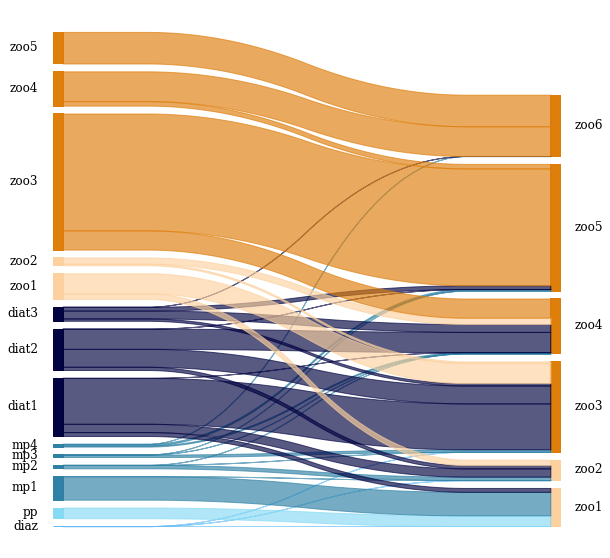

In [630]:
sankey(
    left=df_graze_cold["prey"], right=df_graze_cold["pred"], 
    leftWeight= df_graze_cold["dec"], rightWeight=df_graze_cold["dec"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_cold_years_12_"+region+".png", bbox_inches="tight", dpi=200)

## Warm years

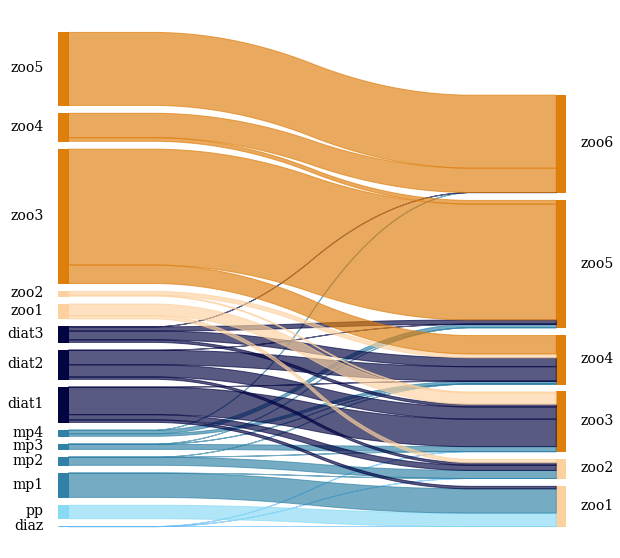

In [631]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["jan"], rightWeight=df_graze_warm["jan"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_01_"+region+".png", bbox_inches="tight", dpi=200)


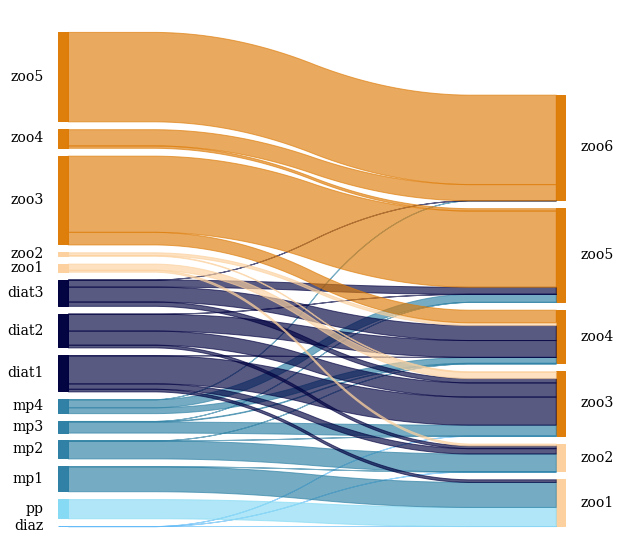

In [632]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["feb"], rightWeight=df_graze_warm["feb"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_02_"+region+".png", bbox_inches="tight", dpi=200)

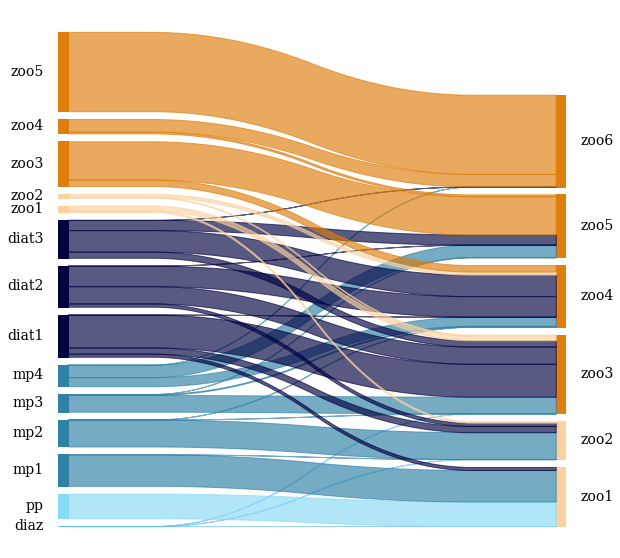

In [633]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["mar"], rightWeight=df_graze_warm["mar"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_03_"+region+".png", bbox_inches="tight", dpi=200)

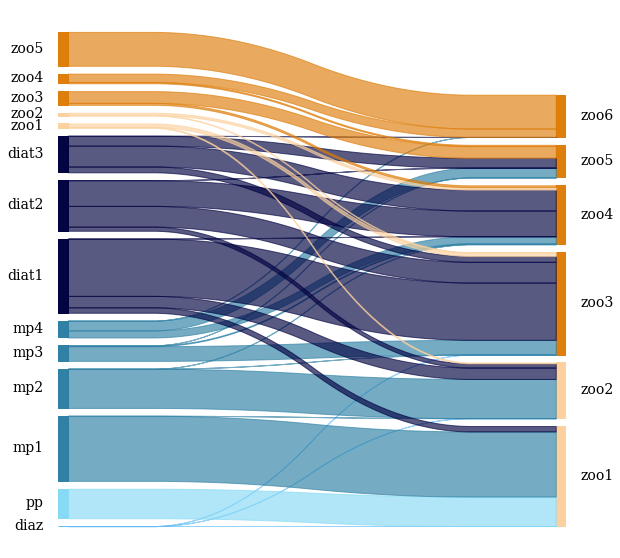

In [634]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["apr"], rightWeight=df_graze_warm["apr"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_04_"+region+".png", bbox_inches="tight", dpi=200)

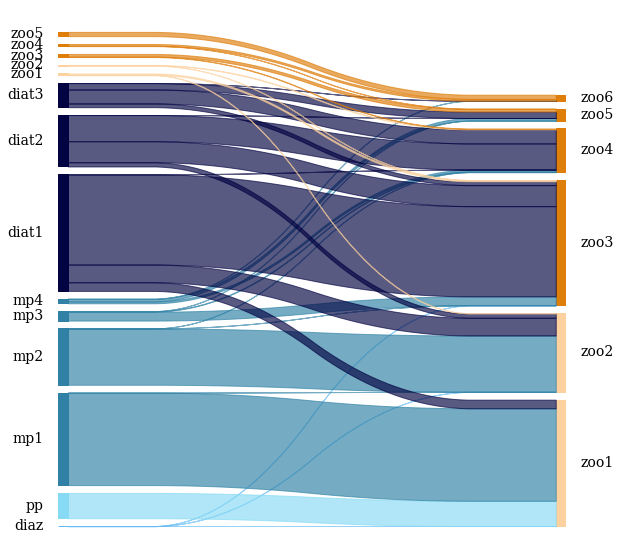

In [635]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["may"], rightWeight=df_graze_warm["may"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_05_"+region+".png", bbox_inches="tight", dpi=200)

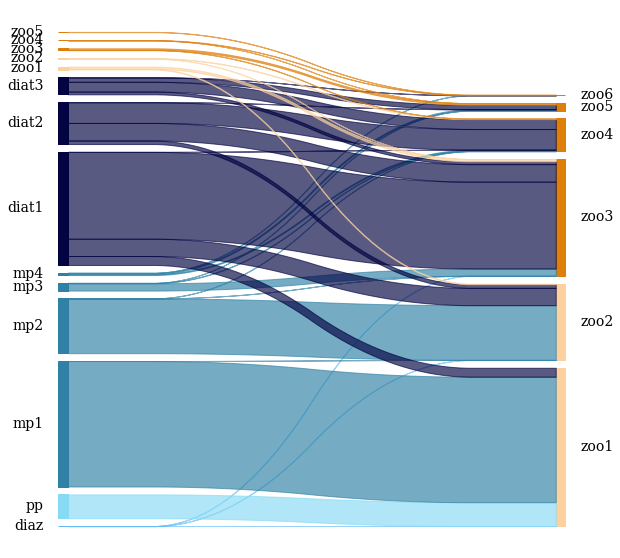

In [636]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["jun"], rightWeight=df_graze_warm["jun"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_06_"+region+".png", bbox_inches="tight", dpi=200)

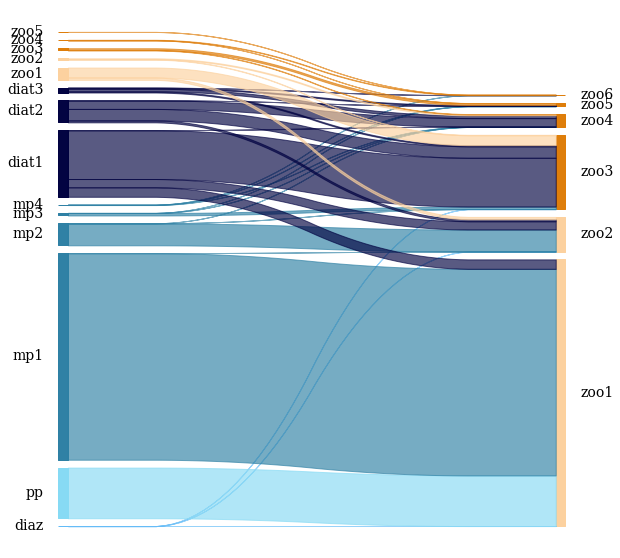

In [637]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["jul"], rightWeight=df_graze_warm["jul"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_07_"+region+".png", bbox_inches="tight", dpi=200)

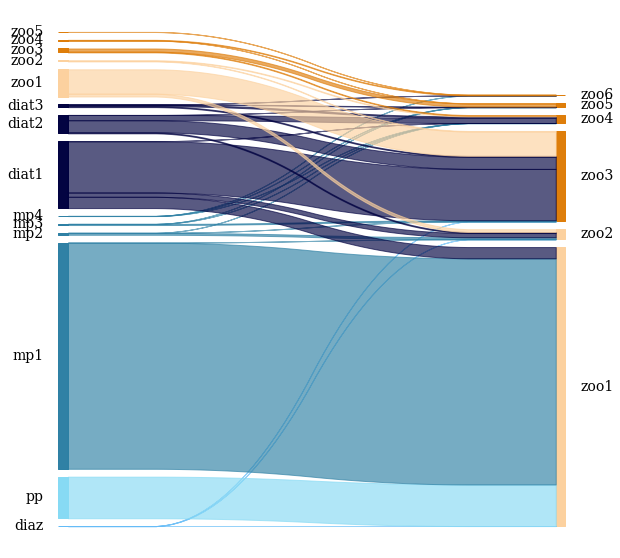

In [638]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["aug"], rightWeight=df_graze_warm["aug"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_08_"+region+".png", bbox_inches="tight", dpi=200)

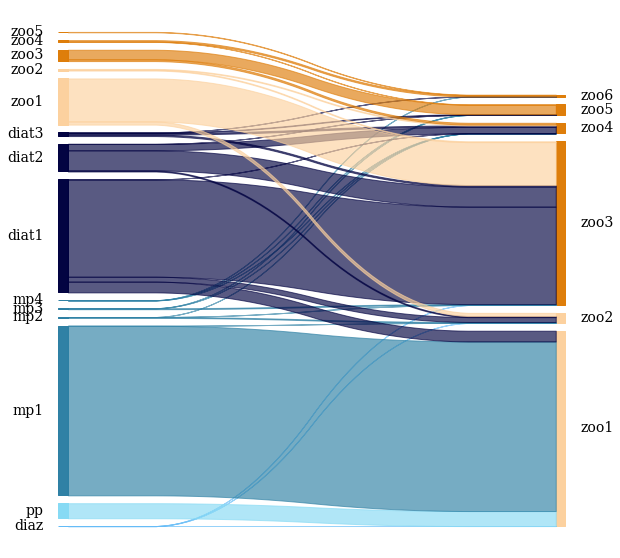

In [639]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["sep"], rightWeight=df_graze_warm["sep"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_09_"+region+".png", bbox_inches="tight", dpi=200)

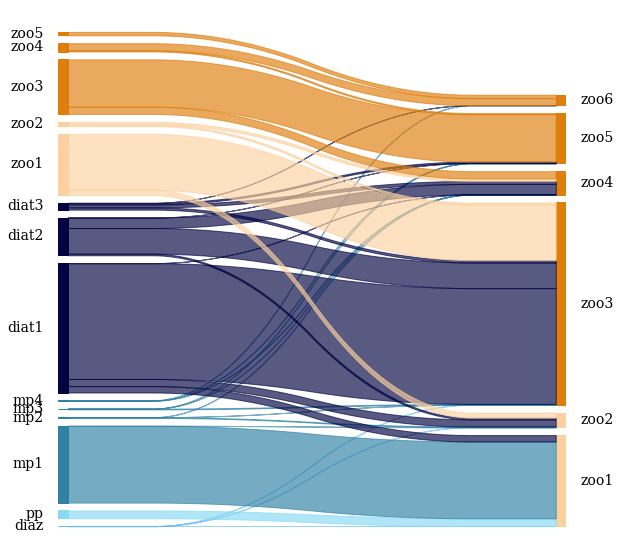

In [640]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["oct"], rightWeight=df_graze_warm["oct"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_10_"+region+".png", bbox_inches="tight", dpi=200)

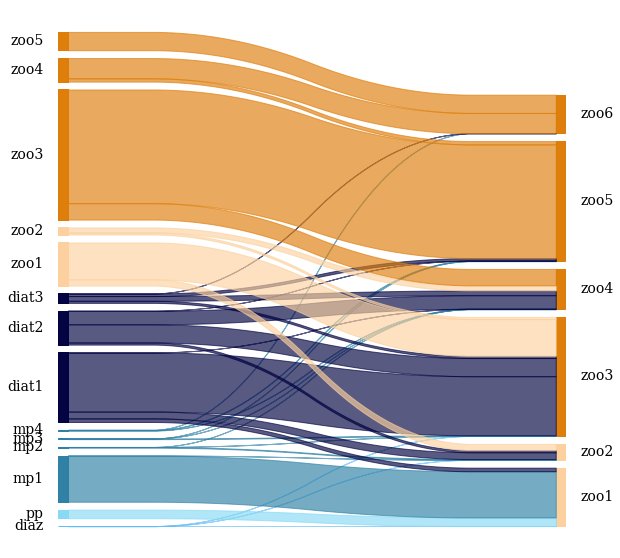

In [641]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["nov"], rightWeight=df_graze_warm["nov"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_11_"+region+".png", bbox_inches="tight", dpi=200)

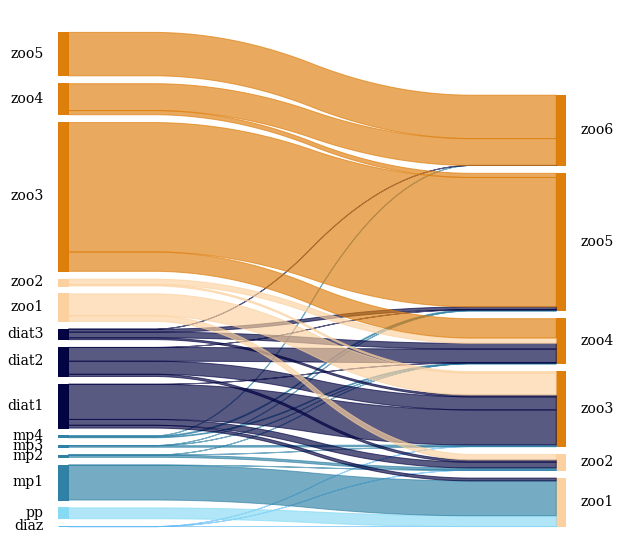

In [642]:
sankey(
    left=df_graze_warm["prey"], right=df_graze_warm["pred"], 
    leftWeight= df_graze_warm["dec"], rightWeight=df_graze_warm["dec"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_warm_years_12_"+region+".png", bbox_inches="tight", dpi=200)

# Ice Fraction

In [643]:
temp_inds = sorted(glob.glob('/glade/scratch/gabyn/SPECTRA/GNG595_monthly_yearly_1948_2009/regrid_SPECTRA_ECOSYS_IFRAC*.nc', recursive=True))
ds= xr.open_mfdataset(temp_inds,concat_dim='time', combine='nested') # Full 62 years of second cycle

In [644]:
ECOSYS_IFRAC_ds_inter = np.empty([63,12,180,360])
ECOSYS_IFRAC_ds_inter[:] = np.nan
x = np.array(range(0,756,12)) ## this loops from 0 to 2016, and selects every 12th number. 
for i in range(63):
    ECOSYS_IFRAC_ds_inter[i,:,:,:] = ds.ECOSYS_IFRAC[x[i]:x[i]+12,:,:]

In [645]:
ice_arctic = np.nanmean(ECOSYS_IFRAC_ds_inter[:,:,170:180,:], axis=(2,3))
ice_arctic_anom = ice_arctic-np.nanmean(ice_arctic,axis=0)
err_ao = np.nanstd(ice_arctic_anom,axis=(0,1))

# Selecting the warm and cold years as less or more than 1/3 of standard deviation 
low_ice_years_arctic = np.where(np.nanmean(ice_arctic_anom,axis=1) < -(err_ao/2))
high_ice_years_arctic = np.where(np.nanmean(ice_arctic_anom,axis=1) > (err_ao/2))

In [646]:
low_ice_years = graze_ds_inter[:,low_ice_years_arctic,:,:,170:180,:]
high_ice_years = graze_ds_inter[:,high_ice_years_arctic,:,:,170:180,:]

In [647]:
low_ice_yrs = np.nanmean(low_ice_years,axis=(1,2))
high_ice_yrs = np.nanmean(high_ice_years,axis=(1,2))

In [648]:
graze_low_ice = np.sum(low_ice_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [649]:
graze_high_ice = np.sum(high_ice_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [650]:
graze_split_low_ice = np.array(graze_split) 
graze_split_high_ice = np.array(graze_split) 

In [651]:
# Annual years with lower Ice fraction
for i in range(len(graze_split.index)):
    graze_split_low_ice[i,3] = prey_varnames[graze_split_low_ice[i,1]] # populate index of prey in array 
    graze_split_low_ice[i,4] = pred_varnames[graze_split_low_ice[i,2]] # populate idex of predator in array 
    graze_split_low_ice[i,5] = np.nansum(graze_low_ice[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_low_ice[i,6] = (np.nansum(graze_low_ice[i,:,:,:]) / np.nansum(graze_low_ice))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_low_ice[i,7] = (np.nansum(graze_low_ice[i,0,:,:]) / np.nansum(graze_low_ice[:,0,:,:]))*100 # Jan
    graze_split_low_ice[i,8] = (np.nansum(graze_low_ice[i,1,:,:]) / np.nansum(graze_low_ice[:,1,:,:]))*100 # Feb
    graze_split_low_ice[i,9] = (np.nansum(graze_low_ice[i,2,:,:]) / np.nansum(graze_low_ice[:,2,:,:]))*100 # Mar
    graze_split_low_ice[i,10] = (np.nansum(graze_low_ice[i,3,:,:]) / np.nansum(graze_low_ice[:,3,:,:]))*100 # Apr
    graze_split_low_ice[i,11] = (np.nansum(graze_low_ice[i,4,:,:]) / np.nansum(graze_low_ice[:,4,:,:]))*100 # May
    graze_split_low_ice[i,12] = (np.nansum(graze_low_ice[i,5,:,:]) / np.nansum(graze_low_ice[:,5,:,:]))*100 # Jun
    graze_split_low_ice[i,13] = (np.nansum(graze_low_ice[i,6,:,:]) / np.nansum(graze_low_ice[:,6,:,:]))*100 # Jul
    graze_split_low_ice[i,14] = (np.nansum(graze_low_ice[i,7,:,:]) / np.nansum(graze_low_ice[:,7,:,:]))*100 # Aug
    graze_split_low_ice[i,15] = (np.nansum(graze_low_ice[i,8,:,:]) / np.nansum(graze_low_ice[:,8,:,:]))*100 # Sep
    graze_split_low_ice[i,16] = (np.nansum(graze_low_ice[i,9,:,:]) / np.nansum(graze_low_ice[:,9,:,:]))*100 # Oct
    graze_split_low_ice[i,17] = (np.nansum(graze_low_ice[i,10,:,:]) / np.nansum(graze_low_ice[:,10,:,:]))*100 # Nov
    graze_split_low_ice[i,18] = (np.nansum(graze_low_ice[i,11,:,:]) / np.nansum(graze_low_ice[:,11,:,:]))*100 # De
    
df_graze_low_ice = pd.DataFrame(np.array(graze_split_low_ice),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

In [652]:
# Annual years with higher ice fraction 
for i in range(len(graze_split.index)):
    graze_split_high_ice[i,3] = prey_varnames[graze_split_high_ice[i,1]] # populate index of prey in array 
    graze_split_high_ice[i,4] = pred_varnames[graze_split_high_ice[i,2]] # populate idex of predator in array 
    graze_split_high_ice[i,5] = np.nansum(graze_high_ice[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_high_ice[i,6] = (np.nansum(graze_high_ice[i,:,:,:]) / np.nansum(graze_high_ice))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_high_ice[i,7] = (np.nansum(graze_high_ice[i,0,:,:]) / np.nansum(graze_high_ice[:,0,:,:]))*100 # Jan
    graze_split_high_ice[i,8] = (np.nansum(graze_high_ice[i,1,:,:]) / np.nansum(graze_high_ice[:,1,:,:]))*100 # Feb
    graze_split_high_ice[i,9] = (np.nansum(graze_high_ice[i,2,:,:]) / np.nansum(graze_high_ice[:,2,:,:]))*100 # Mar
    graze_split_high_ice[i,10] = (np.nansum(graze_high_ice[i,3,:,:]) / np.nansum(graze_high_ice[:,3,:,:]))*100 # Apr
    graze_split_high_ice[i,11] = (np.nansum(graze_high_ice[i,4,:,:]) / np.nansum(graze_high_ice[:,4,:,:]))*100 # May
    graze_split_high_ice[i,12] = (np.nansum(graze_high_ice[i,5,:,:]) / np.nansum(graze_high_ice[:,5,:,:]))*100 # Jun
    graze_split_high_ice[i,13] = (np.nansum(graze_high_ice[i,6,:,:]) / np.nansum(graze_high_ice[:,6,:,:]))*100 # Jul
    graze_split_high_ice[i,14] = (np.nansum(graze_high_ice[i,7,:,:]) / np.nansum(graze_high_ice[:,7,:,:]))*100 # Aug
    graze_split_high_ice[i,15] = (np.nansum(graze_high_ice[i,8,:,:]) / np.nansum(graze_high_ice[:,8,:,:]))*100 # Sep
    graze_split_high_ice[i,16] = (np.nansum(graze_high_ice[i,9,:,:]) / np.nansum(graze_high_ice[:,9,:,:]))*100 # Oct
    graze_split_high_ice[i,17] = (np.nansum(graze_high_ice[i,10,:,:]) / np.nansum(graze_high_ice[:,10,:,:]))*100 # Nov
    graze_split_high_ice[i,18] = (np.nansum(graze_high_ice[i,11,:,:]) / np.nansum(graze_high_ice[:,11,:,:]))*100 # De
    
df_graze_high_ice = pd.DataFrame(np.array(graze_split_high_ice),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

## Low Ice Fraction Years

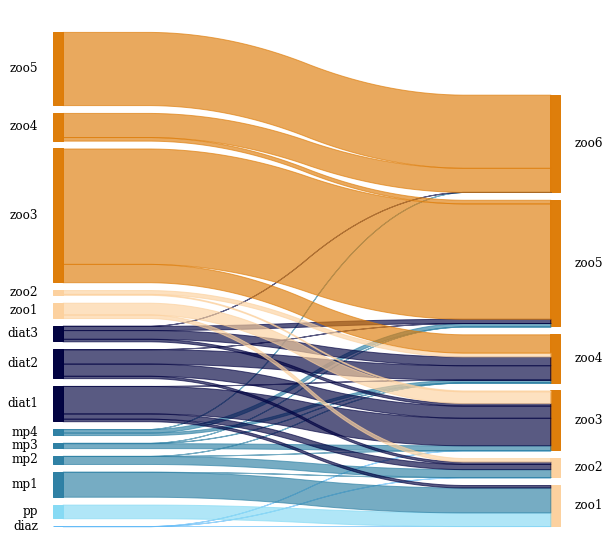

In [653]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["jan"], rightWeight=df_graze_low_ice["jan"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_01_"+region+".png", bbox_inches="tight", dpi=200)

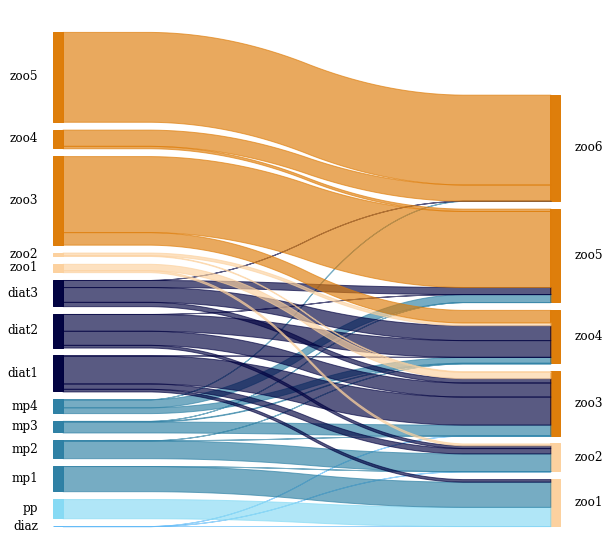

In [654]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["feb"], rightWeight=df_graze_low_ice["feb"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_02_"+region+".png", bbox_inches="tight", dpi=200)

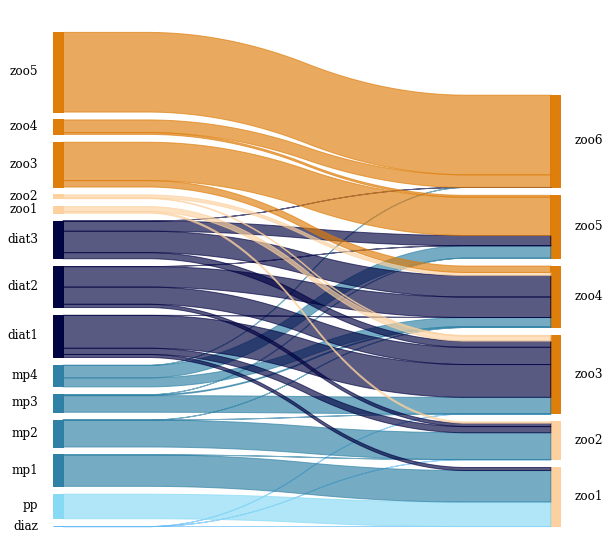

In [655]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["mar"], rightWeight=df_graze_low_ice["mar"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_03_"+region+".png", bbox_inches="tight", dpi=200)

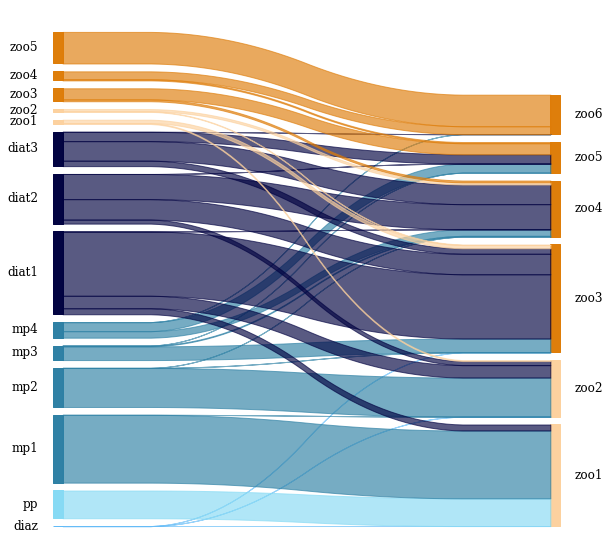

In [656]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["apr"], rightWeight=df_graze_low_ice["apr"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_04_"+region+".png", bbox_inches="tight", dpi=200)

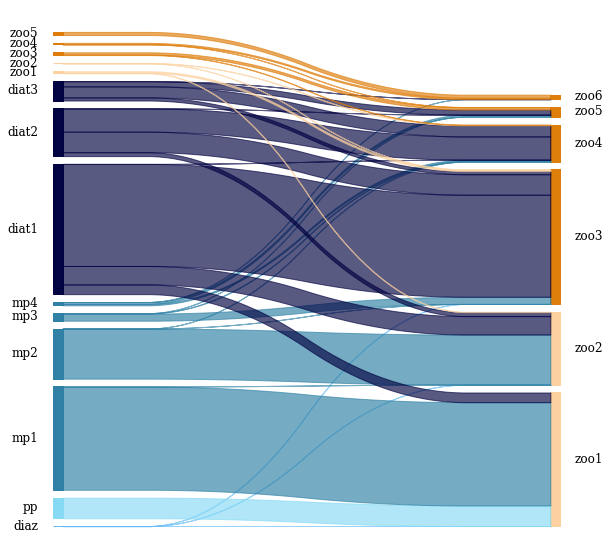

In [657]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["may"], rightWeight=df_graze_low_ice["may"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_05_"+region+".png", bbox_inches="tight", dpi=200)

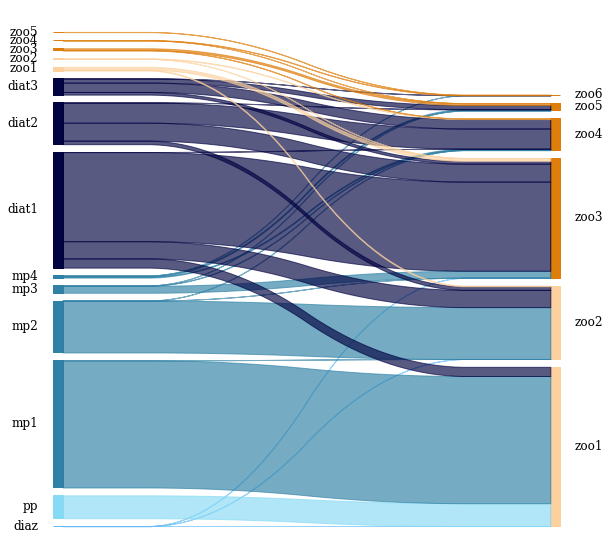

In [658]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["jun"], rightWeight=df_graze_low_ice["jun"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_06_"+region+".png", bbox_inches="tight", dpi=200)

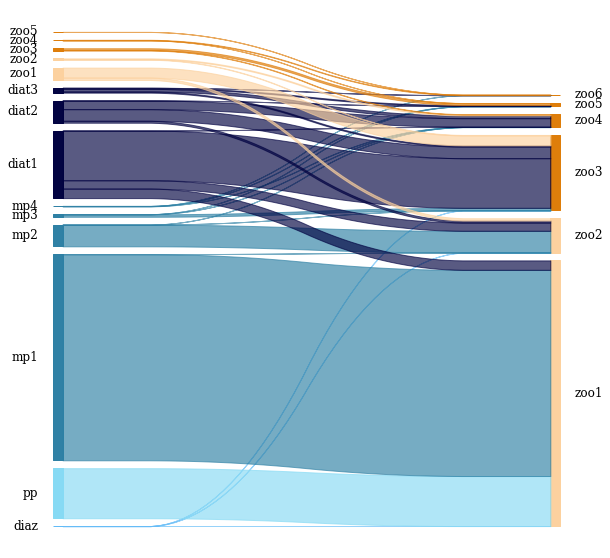

In [659]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["jul"], rightWeight=df_graze_low_ice["jul"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_07_"+region+".png", bbox_inches="tight", dpi=200)

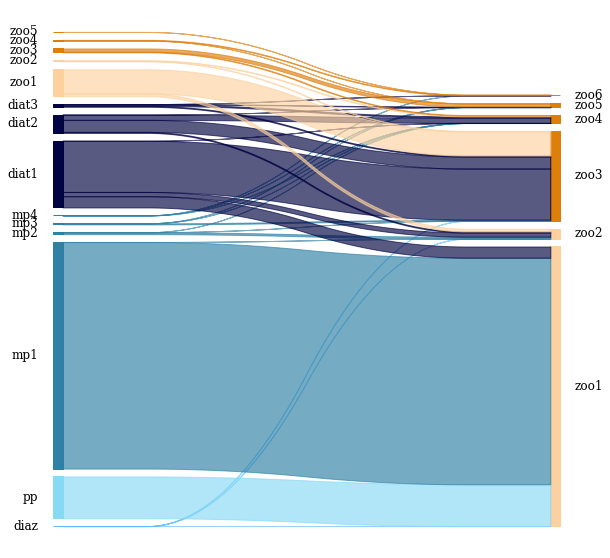

In [660]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["aug"], rightWeight=df_graze_low_ice["aug"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_08_"+region+".png", bbox_inches="tight", dpi=200)

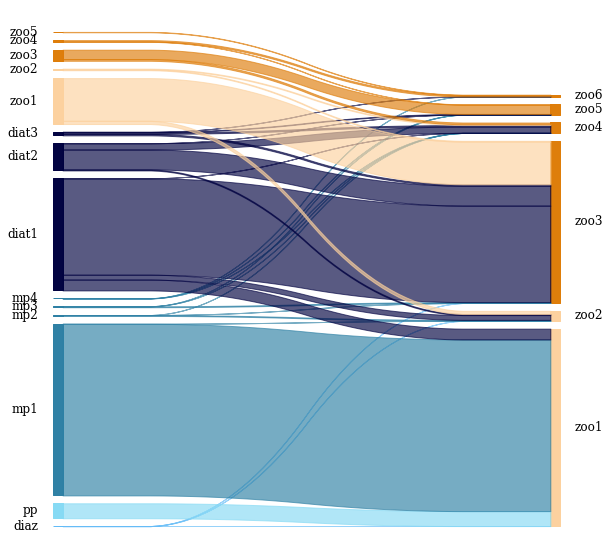

In [661]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["sep"], rightWeight=df_graze_low_ice["sep"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_09_"+region+".png", bbox_inches="tight", dpi=200)

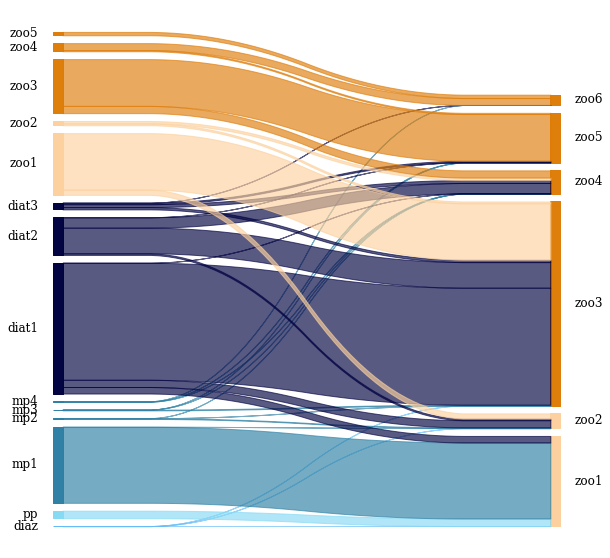

In [662]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["oct"], rightWeight=df_graze_low_ice["oct"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_10_"+region+".png", bbox_inches="tight", dpi=200)

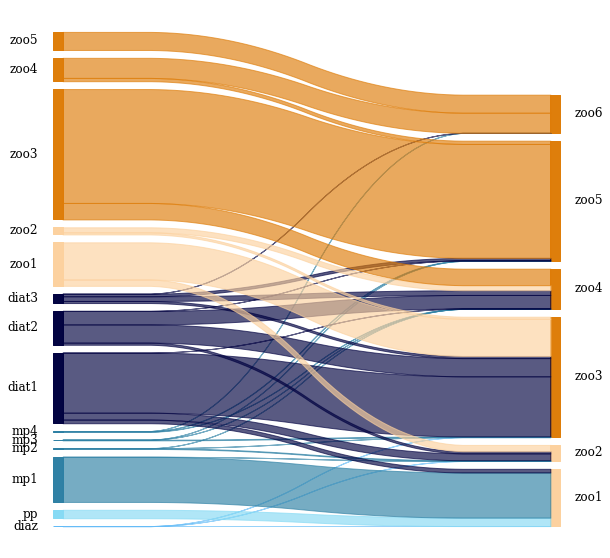

In [663]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["nov"], rightWeight=df_graze_low_ice["nov"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_11_"+region+".png", bbox_inches="tight", dpi=200)

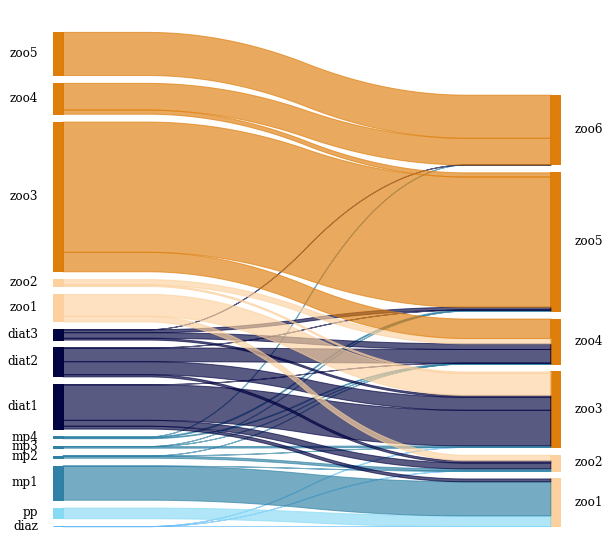

In [664]:
sankey(
    left=df_graze_low_ice["prey"], right=df_graze_low_ice["pred"], 
    leftWeight= df_graze_low_ice["dec"], rightWeight=df_graze_low_ice["dec"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_IceFrac_years_12_"+region+".png", bbox_inches="tight", dpi=200)

## High Ice Fraction Years

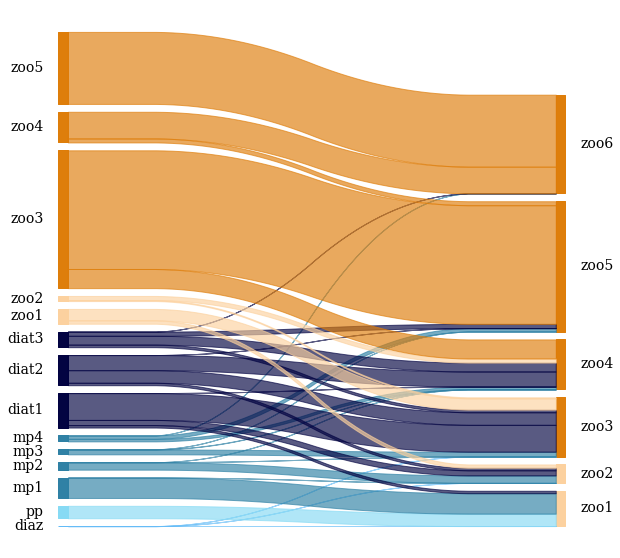

In [665]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["jan"], rightWeight=df_graze_high_ice["jan"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_01_"+region+".png", bbox_inches="tight", dpi=200)

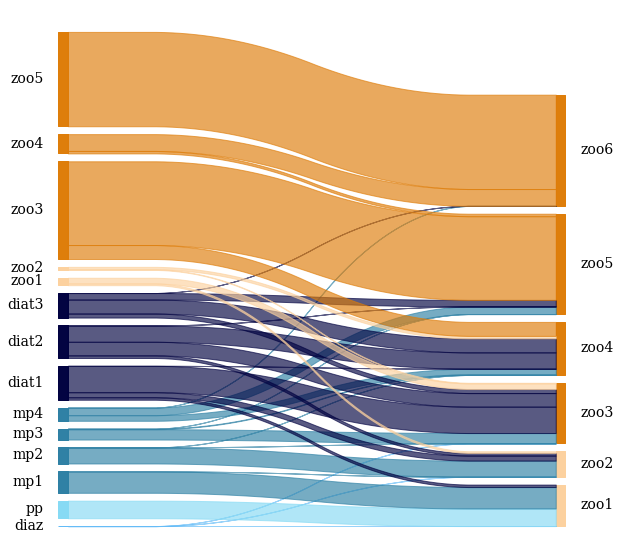

In [666]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["feb"], rightWeight=df_graze_high_ice["feb"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_02_"+region+".png", bbox_inches="tight", dpi=200)

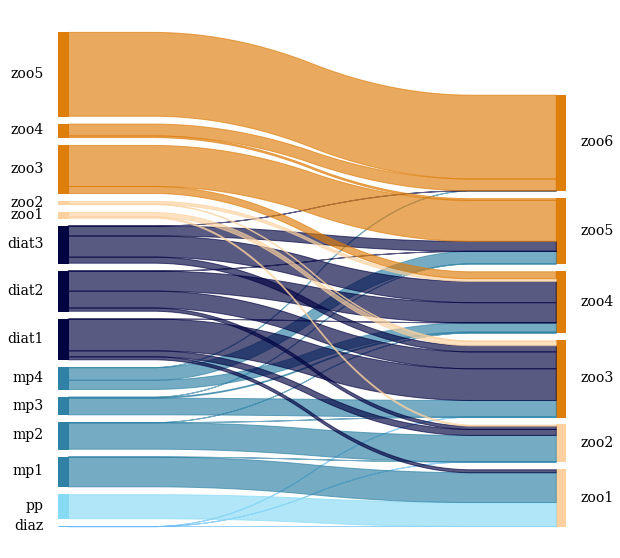

In [667]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["mar"], rightWeight=df_graze_high_ice["mar"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_03_"+region+".png", bbox_inches="tight", dpi=200)

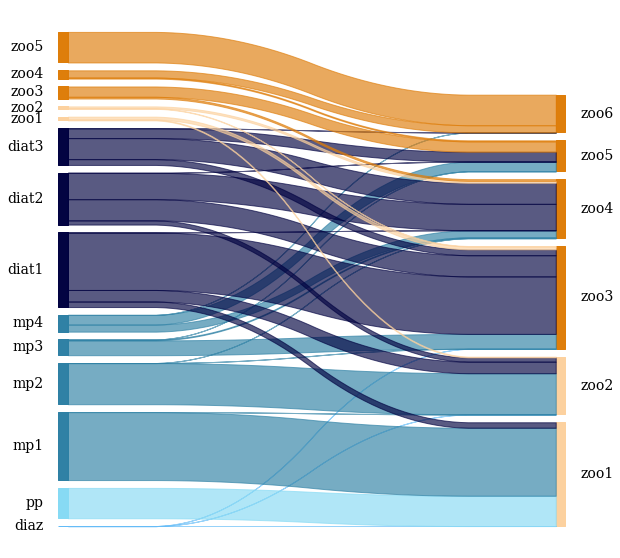

In [668]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["apr"], rightWeight=df_graze_high_ice["apr"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_04_"+region+".png", bbox_inches="tight", dpi=200)

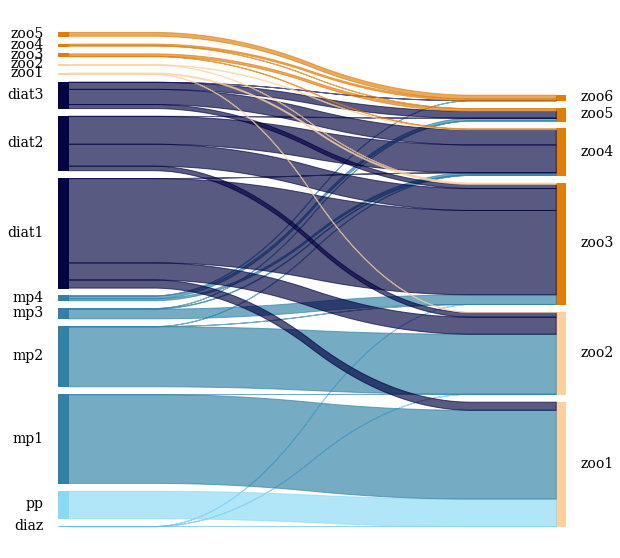

In [669]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["may"], rightWeight=df_graze_high_ice["may"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_05_"+region+".png", bbox_inches="tight", dpi=200)

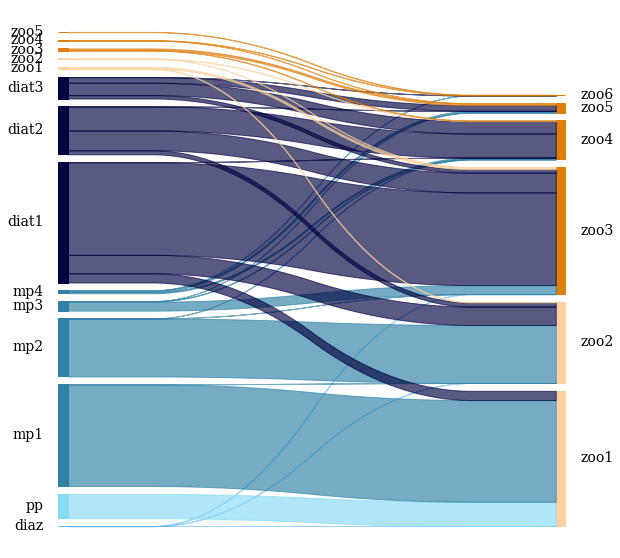

In [670]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["jun"], rightWeight=df_graze_high_ice["jun"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_06_"+region+".png", bbox_inches="tight", dpi=200)

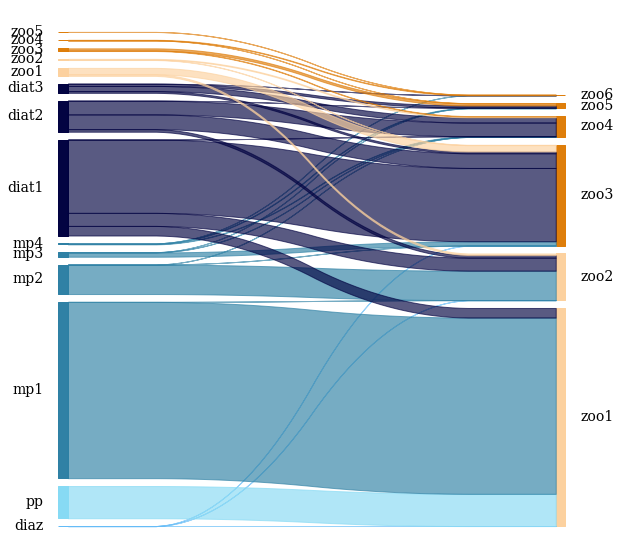

In [671]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["jul"], rightWeight=df_graze_high_ice["jul"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_07_"+region+".png", bbox_inches="tight", dpi=200)

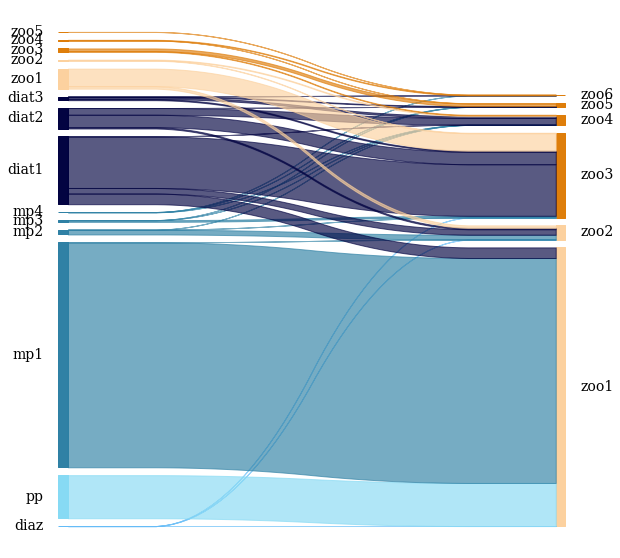

In [672]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["aug"], rightWeight=df_graze_high_ice["aug"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_08_"+region+".png", bbox_inches="tight", dpi=200)

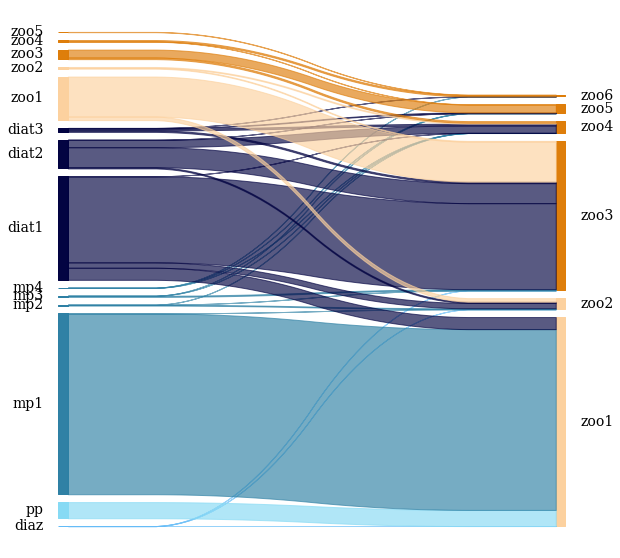

In [673]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["sep"], rightWeight=df_graze_high_ice["sep"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_09_"+region+".png", bbox_inches="tight", dpi=200)

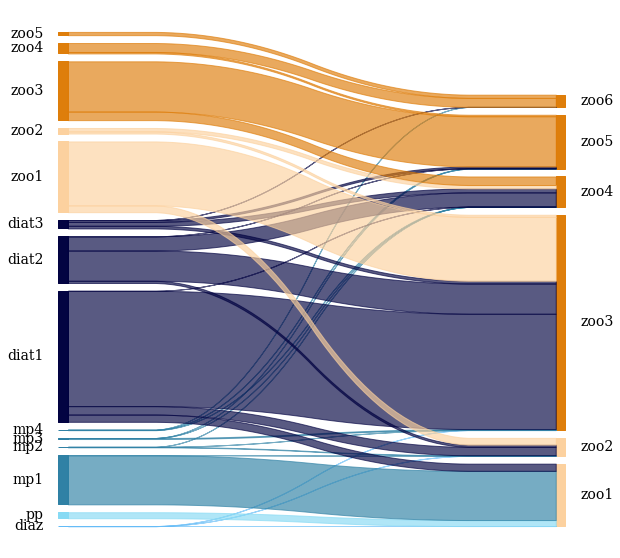

In [674]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["oct"], rightWeight=df_graze_high_ice["oct"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_10_"+region+".png", bbox_inches="tight", dpi=200)

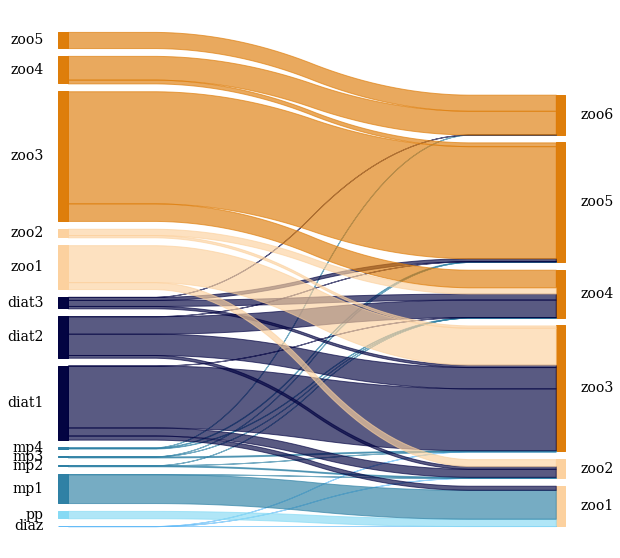

In [675]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["nov"], rightWeight=df_graze_high_ice["nov"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_11_"+region+".png", bbox_inches="tight", dpi=200)

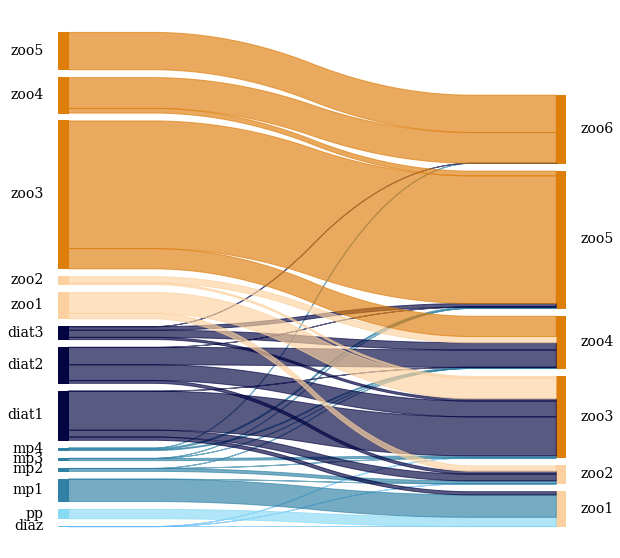

In [676]:
sankey(
    left=df_graze_high_ice["prey"], right=df_graze_high_ice["pred"], 
    leftWeight= df_graze_high_ice["dec"], rightWeight=df_graze_high_ice["dec"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_IceFrac_years_12_"+region+".png", bbox_inches="tight", dpi=200)

## Nutrients 

In [677]:
NO3_inds = sorted(glob.glob('/glade/scratch/gabyn/SPECTRA/GNG595_monthly_yearly_1948_2009/regrid_SPECTRA_NO3*.nc', recursive=True))
ds= xr.open_mfdataset(NO3_inds,concat_dim='time', combine='nested') # Full 62 years of second cycle

In [678]:
NO3_ds_inter = np.empty([63,12,180,360])
NO3_ds_inter[:] = np.nan
x = np.array(range(0,756,12)) ## this loops from 0 to 2016, and selects every 12th number. 
for i in range(63):
    NO3_ds_inter[i,:,:,:] = ds.NO3[x[i]:x[i]+12,0,:,:]

In [679]:
no3_arctic = np.nanmean(NO3_ds_inter[:,:,170:180,:], axis=(2,3))
no3_arctic_anom = no3_arctic-np.nanmean(no3_arctic,axis=0)
err_ao = np.nanstd(no3_arctic_anom,axis=(0,1))

# Selecting the warm and cold years as less or more than 1/3 of standard deviation 
low_no3_years_arctic = np.where(np.nanmean(no3_arctic_anom,axis=1) < -(err_ao/2))
high_no3_years_arctic = np.where(np.nanmean(no3_arctic_anom,axis=1) > (err_ao/2))

In [680]:
low_no3_years = graze_ds_inter[:,low_no3_years_arctic,:,:,170:180,:]
high_no3_years = graze_ds_inter[:,high_no3_years_arctic,:,:,170:180,:]

In [681]:
low_no3_yrs = np.nanmean(low_no3_years,axis=(1,2))
high_no3_yrs = np.nanmean(high_no3_years,axis=(1,2))

In [682]:
graze_low_no3 = np.sum(low_no3_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [683]:
graze_high_no3 = np.sum(high_no3_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [684]:
graze_split_low_no3 = np.array(graze_split) 
graze_split_high_no3 = np.array(graze_split) 

In [685]:
# Annual Cold years
for i in range(len(graze_split.index)):
    graze_split_low_no3[i,3] = prey_varnames[graze_split_low_no3[i,1]] # populate index of prey in array 
    graze_split_low_no3[i,4] = pred_varnames[graze_split_low_no3[i,2]] # populate idex of predator in array 
    graze_split_low_no3[i,5] = np.nansum(graze_low_no3[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_low_no3[i,6] = (np.nansum(graze_low_no3[i,:,:,:]) / np.nansum(graze_low_no3))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_low_no3[i,7] = (np.nansum(graze_low_no3[i,0,:,:]) / np.nansum(graze_low_no3[:,0,:,:]))*100 # Jan
    graze_split_low_no3[i,8] = (np.nansum(graze_low_no3[i,1,:,:]) / np.nansum(graze_low_no3[:,1,:,:]))*100 # Feb
    graze_split_low_no3[i,9] = (np.nansum(graze_low_no3[i,2,:,:]) / np.nansum(graze_low_no3[:,2,:,:]))*100 # Mar
    graze_split_low_no3[i,10] = (np.nansum(graze_low_no3[i,3,:,:]) / np.nansum(graze_low_no3[:,3,:,:]))*100 # Apr
    graze_split_low_no3[i,11] = (np.nansum(graze_low_no3[i,4,:,:]) / np.nansum(graze_low_no3[:,4,:,:]))*100 # May
    graze_split_low_no3[i,12] = (np.nansum(graze_low_no3[i,5,:,:]) / np.nansum(graze_low_no3[:,5,:,:]))*100 # Jun
    graze_split_low_no3[i,13] = (np.nansum(graze_low_no3[i,6,:,:]) / np.nansum(graze_low_no3[:,6,:,:]))*100 # Jul
    graze_split_low_no3[i,14] = (np.nansum(graze_low_no3[i,7,:,:]) / np.nansum(graze_low_no3[:,7,:,:]))*100 # Aug
    graze_split_low_no3[i,15] = (np.nansum(graze_low_no3[i,8,:,:]) / np.nansum(graze_low_no3[:,8,:,:]))*100 # Sep
    graze_split_low_no3[i,16] = (np.nansum(graze_low_no3[i,9,:,:]) / np.nansum(graze_low_no3[:,9,:,:]))*100 # Oct
    graze_split_low_no3[i,17] = (np.nansum(graze_low_no3[i,10,:,:]) / np.nansum(graze_low_no3[:,10,:,:]))*100 # Nov
    graze_split_low_no3[i,18] = (np.nansum(graze_low_no3[i,11,:,:]) / np.nansum(graze_low_no3[:,11,:,:]))*100 # De
    
df_graze_low_no3 = pd.DataFrame(np.array(graze_split_low_no3),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

In [686]:
# Annual warm years
for i in range(len(graze_split.index)):
    graze_split_high_no3[i,3] = prey_varnames[graze_split_high_no3[i,1]] # populate index of prey in array 
    graze_split_high_no3[i,4] = pred_varnames[graze_split_high_no3[i,2]] # populate idex of predator in array 
    graze_split_high_no3[i,5] = np.nansum(graze_high_no3[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_high_no3[i,6] = (np.nansum(graze_high_no3[i,:,:,:]) / np.nansum(graze_high_no3))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_high_no3[i,7] = (np.nansum(graze_high_no3[i,0,:,:]) / np.nansum(graze_high_no3[:,0,:,:]))*100 # Jan
    graze_split_high_no3[i,8] = (np.nansum(graze_high_no3[i,1,:,:]) / np.nansum(graze_high_no3[:,1,:,:]))*100 # Feb
    graze_split_high_no3[i,9] = (np.nansum(graze_high_no3[i,2,:,:]) / np.nansum(graze_high_no3[:,2,:,:]))*100 # Mar
    graze_split_high_no3[i,10] = (np.nansum(graze_high_no3[i,3,:,:]) / np.nansum(graze_high_no3[:,3,:,:]))*100 # Apr
    graze_split_high_no3[i,11] = (np.nansum(graze_high_no3[i,4,:,:]) / np.nansum(graze_high_no3[:,4,:,:]))*100 # May
    graze_split_high_no3[i,12] = (np.nansum(graze_high_no3[i,5,:,:]) / np.nansum(graze_high_no3[:,5,:,:]))*100 # Jun
    graze_split_high_no3[i,13] = (np.nansum(graze_high_no3[i,6,:,:]) / np.nansum(graze_high_no3[:,6,:,:]))*100 # Jul
    graze_split_high_no3[i,14] = (np.nansum(graze_high_no3[i,7,:,:]) / np.nansum(graze_high_no3[:,7,:,:]))*100 # Aug
    graze_split_high_no3[i,15] = (np.nansum(graze_high_no3[i,8,:,:]) / np.nansum(graze_high_no3[:,8,:,:]))*100 # Sep
    graze_split_high_no3[i,16] = (np.nansum(graze_high_no3[i,9,:,:]) / np.nansum(graze_high_no3[:,9,:,:]))*100 # Oct
    graze_split_high_no3[i,17] = (np.nansum(graze_high_no3[i,10,:,:]) / np.nansum(graze_high_no3[:,10,:,:]))*100 # Nov
    graze_split_high_no3[i,18] = (np.nansum(graze_high_no3[i,11,:,:]) / np.nansum(graze_high_no3[:,11,:,:]))*100 # De
    
df_graze_high_no3 = pd.DataFrame(np.array(graze_split_high_no3),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

## Low NO3

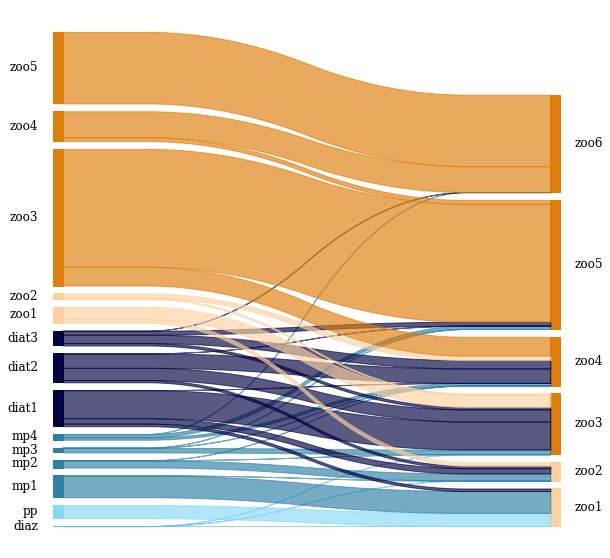

In [687]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["jan"], rightWeight=df_graze_low_no3["jan"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_01_"+region+".png", bbox_inches="tight", dpi=200)

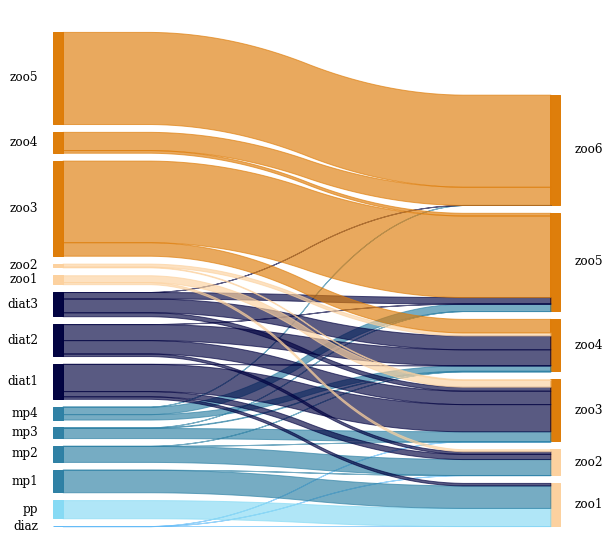

In [688]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["feb"], rightWeight=df_graze_low_no3["feb"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_02_"+region+".png", bbox_inches="tight", dpi=200)

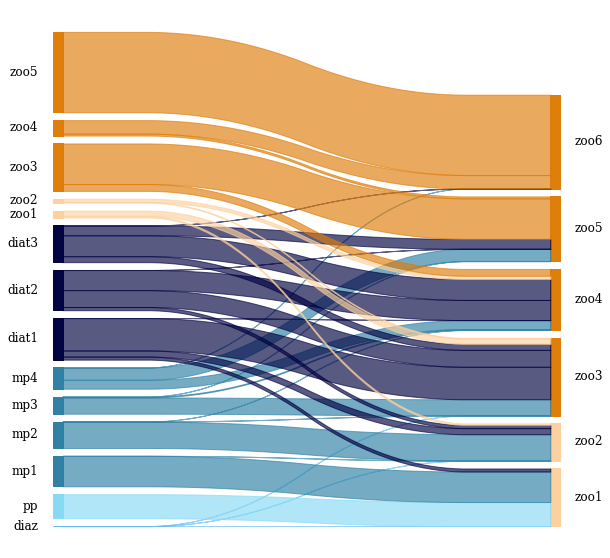

In [689]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["mar"], rightWeight=df_graze_low_no3["mar"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_03_"+region+".png", bbox_inches="tight", dpi=200)

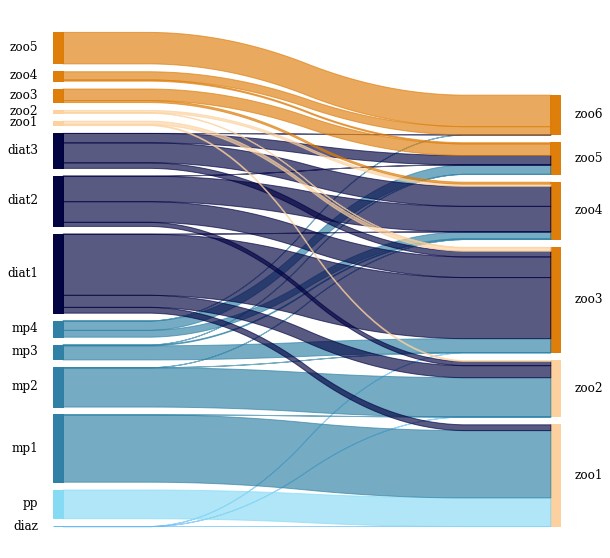

In [690]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["apr"], rightWeight=df_graze_low_no3["apr"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_04_"+region+".png", bbox_inches="tight", dpi=200)

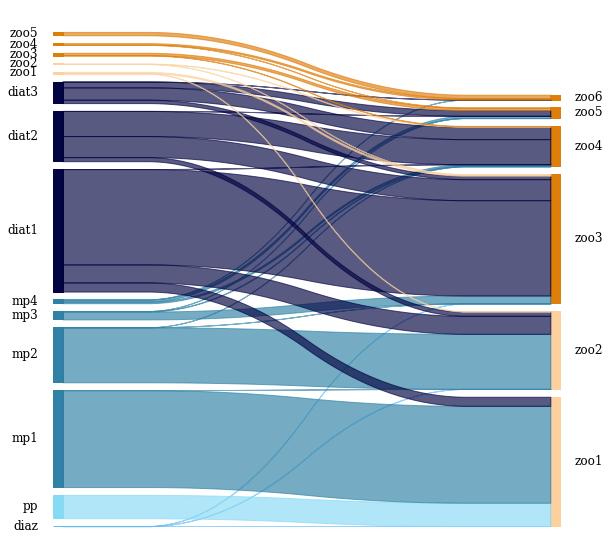

In [691]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["may"], rightWeight=df_graze_low_no3["may"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_05_"+region+".png", bbox_inches="tight", dpi=200)

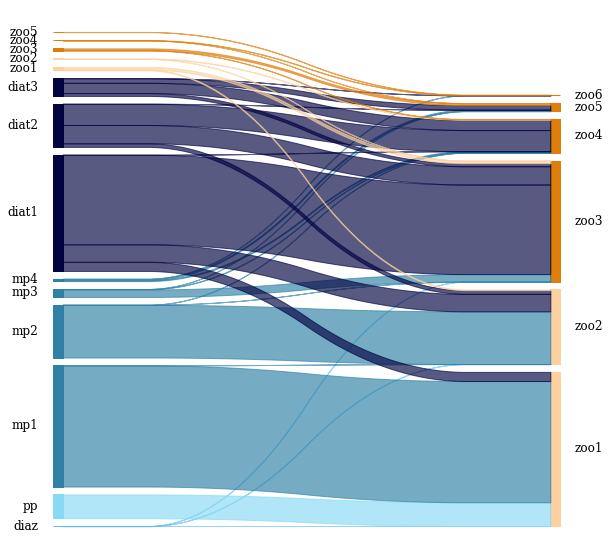

In [692]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["jun"], rightWeight=df_graze_low_no3["jun"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_06_"+region+".png", bbox_inches="tight", dpi=200)

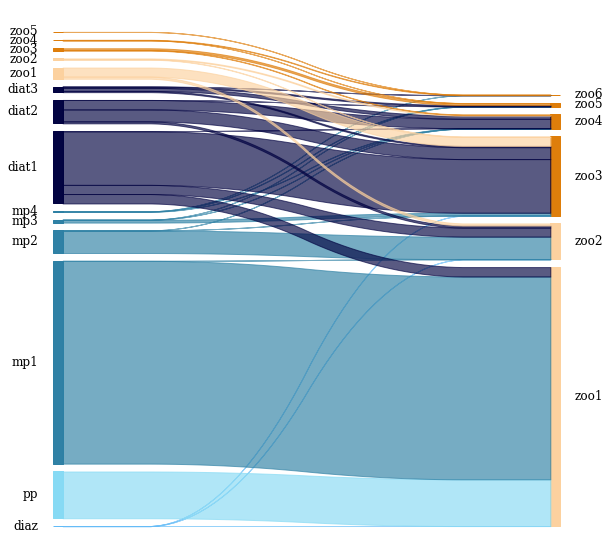

In [693]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["jul"], rightWeight=df_graze_low_no3["jul"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_07_"+region+".png", bbox_inches="tight", dpi=200)

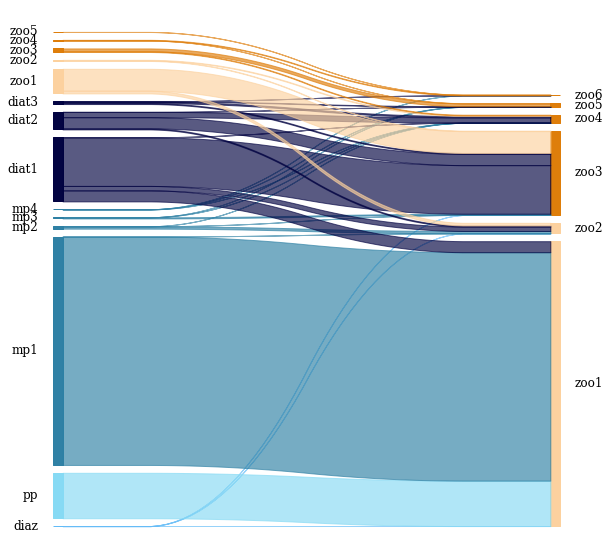

In [694]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["aug"], rightWeight=df_graze_low_no3["aug"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_08_"+region+".png", bbox_inches="tight", dpi=200)

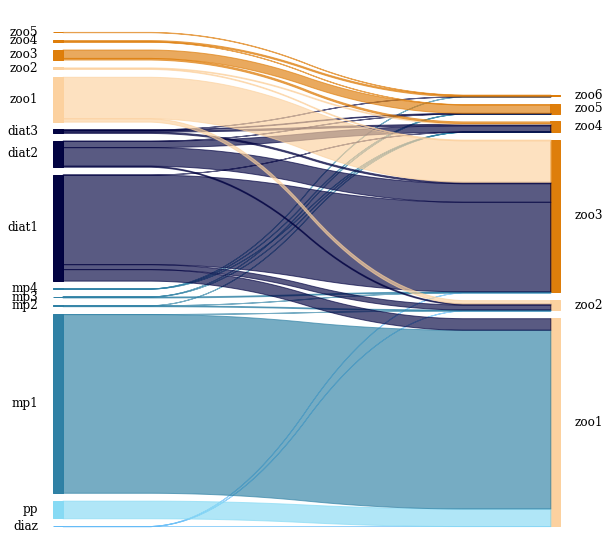

In [695]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["sep"], rightWeight=df_graze_low_no3["sep"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_09_"+region+".png", bbox_inches="tight", dpi=200)

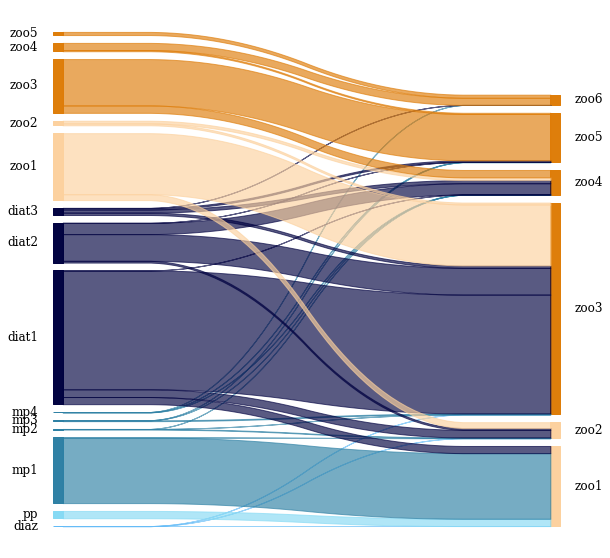

In [696]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["oct"], rightWeight=df_graze_low_no3["oct"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_10_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["nov"], rightWeight=df_graze_low_no3["nov"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_11_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_no3["prey"], right=df_graze_low_no3["pred"], 
    leftWeight= df_graze_low_no3["dec"], rightWeight=df_graze_low_no3["dec"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_no3_years_12_"+region+".png", bbox_inches="tight", dpi=200)

## High NO3

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["jan"], rightWeight=df_graze_high_no3["jan"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_01_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["feb"], rightWeight=df_graze_high_no3["feb"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_02_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["mar"], rightWeight=df_graze_high_no3["mar"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_03_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["apr"], rightWeight=df_graze_high_no3["apr"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_04_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["may"], rightWeight=df_graze_high_no3["may"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_05_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["jun"], rightWeight=df_graze_high_no3["jun"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_06_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["jul"], rightWeight=df_graze_high_no3["jul"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_07_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["aug"], rightWeight=df_graze_high_no3["aug"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_08_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["sep"], rightWeight=df_graze_high_no3["sep"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_09_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["oct"], rightWeight=df_graze_high_no3["oct"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_10_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["nov"], rightWeight=df_graze_high_no3["nov"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_11_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_no3["prey"], right=df_graze_high_no3["pred"], 
    leftWeight= df_graze_high_no3["dec"], rightWeight=df_graze_high_no3["dec"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_no3_years_12_"+region+".png", bbox_inches="tight", dpi=200)

## Light 

In [ ]:
PAR_avg_inds = sorted(glob.glob('/glade/scratch/gabyn/SPECTRA/GNG595_monthly_yearly_1948_2009/regrid_SPECTRA_PAR_avg*.nc', recursive=True))
ds= xr.open_mfdataset(PAR_avg_inds,concat_dim='time', combine='nested') # Full 62 years of second cycle

In [ ]:
PAR_avg_ds_inter = np.empty([63,12,180,360])
PAR_avg_ds_inter[:] = np.nan
x = np.array(range(0,756,12)) ## this loops from 0 to 2016, and selects every 12th number. 
for i in range(63):
    PAR_avg_ds_inter[i,:,:,:] = ds.PAR_avg[x[i]:x[i]+12,0,:,:]

In [ ]:
light_arctic = np.nanmean(PAR_avg_ds_inter[:,:,170:180,:], axis=(2,3))
light_arctic_anom = light_arctic-np.nanmean(light_arctic,axis=0)
err_ao = np.nanstd(light_arctic_anom,axis=(0,1))

# Selecting the warm and cold years as less or more than 1/3 of standard deviation 
low_light_years_arctic = np.where(np.nanmean(light_arctic_anom,axis=1) < -(err_ao/2))
high_light_years_arctic = np.where(np.nanmean(light_arctic_anom,axis=1) > (err_ao/2))

In [ ]:
low_light_years = graze_ds_inter[:,low_light_years_arctic,:,:,170:180,:]
high_light_years = graze_ds_inter[:,high_light_years_arctic,:,:,170:180,:]

In [ ]:
low_light_yrs = np.nanmean(low_light_years,axis=(1,2))
high_light_yrs = np.nanmean(high_light_years,axis=(1,2))

In [ ]:
graze_low_light = np.sum(low_light_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [ ]:
graze_high_light = np.sum(high_light_yrs,axis=2) # I want size (36,12,31,360) (1/2 standard deviation )

In [ ]:
graze_split_low_light = np.array(graze_split) 
graze_split_high_light = np.array(graze_split) 

In [ ]:
# Annual Cold years
for i in range(len(graze_split.index)):
    graze_split_low_light[i,3] = prey_varnames[graze_split_low_light[i,1]] # populate index of prey in array 
    graze_split_low_light[i,4] = pred_varnames[graze_split_low_light[i,2]] # populate idex of predator in array 
    graze_split_low_light[i,5] = np.nansum(graze_low_light[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_low_light[i,6] = (np.nansum(graze_low_light[i,:,:,:]) / np.nansum(graze_low_light))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_low_light[i,7] = (np.nansum(graze_low_light[i,0,:,:]) / np.nansum(graze_low_light[:,0,:,:]))*100 # Jan
    graze_split_low_light[i,8] = (np.nansum(graze_low_light[i,1,:,:]) / np.nansum(graze_low_light[:,1,:,:]))*100 # Feb
    graze_split_low_light[i,9] = (np.nansum(graze_low_light[i,2,:,:]) / np.nansum(graze_low_light[:,2,:,:]))*100 # Mar
    graze_split_low_light[i,10] = (np.nansum(graze_low_light[i,3,:,:]) / np.nansum(graze_low_light[:,3,:,:]))*100 # Apr
    graze_split_low_light[i,11] = (np.nansum(graze_low_light[i,4,:,:]) / np.nansum(graze_low_light[:,4,:,:]))*100 # May
    graze_split_low_light[i,12] = (np.nansum(graze_low_light[i,5,:,:]) / np.nansum(graze_low_light[:,5,:,:]))*100 # Jun
    graze_split_low_light[i,13] = (np.nansum(graze_low_light[i,6,:,:]) / np.nansum(graze_low_light[:,6,:,:]))*100 # Jul
    graze_split_low_light[i,14] = (np.nansum(graze_low_light[i,7,:,:]) / np.nansum(graze_low_light[:,7,:,:]))*100 # Aug
    graze_split_low_light[i,15] = (np.nansum(graze_low_light[i,8,:,:]) / np.nansum(graze_low_light[:,8,:,:]))*100 # Sep
    graze_split_low_light[i,16] = (np.nansum(graze_low_light[i,9,:,:]) / np.nansum(graze_low_light[:,9,:,:]))*100 # Oct
    graze_split_low_light[i,17] = (np.nansum(graze_low_light[i,10,:,:]) / np.nansum(graze_low_light[:,10,:,:]))*100 # Nov
    graze_split_low_light[i,18] = (np.nansum(graze_low_light[i,11,:,:]) / np.nansum(graze_low_light[:,11,:,:]))*100 # De
    
df_graze_low_light = pd.DataFrame(np.array(graze_split_low_light),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

In [ ]:
# Annual warm years
for i in range(len(graze_split.index)):
    graze_split_high_light[i,3] = prey_varnames[graze_split_high_light[i,1]] # populate index of prey in array 
    graze_split_high_light[i,4] = pred_varnames[graze_split_high_light[i,2]] # populate idex of predator in array 
    graze_split_high_light[i,5] = np.nansum(graze_high_light[i,:,:,:]) # add grazing value for corresponding grazing pair(mmol/m^3/s)
    graze_split_high_light[i,6] = (np.nansum(graze_high_light[i,:,:,:]) / np.nansum(graze_high_light))*100 # divide individual grazing to sum of all grazing then divide by 100..
    graze_split_high_light[i,7] = (np.nansum(graze_high_light[i,0,:,:]) / np.nansum(graze_high_light[:,0,:,:]))*100 # Jan
    graze_split_high_light[i,8] = (np.nansum(graze_high_light[i,1,:,:]) / np.nansum(graze_high_light[:,1,:,:]))*100 # Feb
    graze_split_high_light[i,9] = (np.nansum(graze_high_light[i,2,:,:]) / np.nansum(graze_high_light[:,2,:,:]))*100 # Mar
    graze_split_high_light[i,10] = (np.nansum(graze_high_light[i,3,:,:]) / np.nansum(graze_high_light[:,3,:,:]))*100 # Apr
    graze_split_high_light[i,11] = (np.nansum(graze_high_light[i,4,:,:]) / np.nansum(graze_high_light[:,4,:,:]))*100 # May
    graze_split_high_light[i,12] = (np.nansum(graze_high_light[i,5,:,:]) / np.nansum(graze_high_light[:,5,:,:]))*100 # Jun
    graze_split_high_light[i,13] = (np.nansum(graze_high_light[i,6,:,:]) / np.nansum(graze_high_light[:,6,:,:]))*100 # Jul
    graze_split_high_light[i,14] = (np.nansum(graze_high_light[i,7,:,:]) / np.nansum(graze_high_light[:,7,:,:]))*100 # Aug
    graze_split_high_light[i,15] = (np.nansum(graze_high_light[i,8,:,:]) / np.nansum(graze_high_light[:,8,:,:]))*100 # Sep
    graze_split_high_light[i,16] = (np.nansum(graze_high_light[i,9,:,:]) / np.nansum(graze_high_light[:,9,:,:]))*100 # Oct
    graze_split_high_light[i,17] = (np.nansum(graze_high_light[i,10,:,:]) / np.nansum(graze_high_light[:,10,:,:]))*100 # Nov
    graze_split_high_light[i,18] = (np.nansum(graze_high_light[i,11,:,:]) / np.nansum(graze_high_light[:,11,:,:]))*100 # De
    
df_graze_high_light = pd.DataFrame(np.array(graze_split_high_light),
                               columns=['var', 'prey','pred','prey_ind','pred_ind','val','prop','jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']) # rename grazing array and convert into dataframe.

## Low Light

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["jan"], rightWeight=df_graze_low_light["jan"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_01_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["feb"], rightWeight=df_graze_low_light["feb"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_02_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["mar"], rightWeight=df_graze_low_light["mar"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_03_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["apr"], rightWeight=df_graze_low_light["apr"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_04_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["may"], rightWeight=df_graze_low_light["may"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_05_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["jun"], rightWeight=df_graze_low_light["jun"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_06_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["jul"], rightWeight=df_graze_low_light["jul"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_07_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["aug"], rightWeight=df_graze_low_light["aug"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_08_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["sep"], rightWeight=df_graze_low_light["sep"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_09_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["oct"], rightWeight=df_graze_low_light["oct"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_10_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["nov"], rightWeight=df_graze_low_light["nov"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_11_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_low_light["prey"], right=df_graze_low_light["pred"], 
    leftWeight= df_graze_low_light["dec"], rightWeight=df_graze_low_light["dec"], 
    aspect=20, fontsize=12,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic winter average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_low_light_years_12_"+region+".png", bbox_inches="tight", dpi=200)

## High Light

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["jan"], rightWeight=df_graze_high_light["jan"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_01_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["feb"], rightWeight=df_graze_high_light["feb"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_02_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["mar"], rightWeight=df_graze_high_light["mar"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_03_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["apr"], rightWeight=df_graze_high_light["apr"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_04_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["may"], rightWeight=df_graze_high_light["may"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_05_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["jun"], rightWeight=df_graze_high_light["jun"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_06_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["jul"], rightWeight=df_graze_high_light["jul"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_07_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["aug"], rightWeight=df_graze_high_light["aug"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_08_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["sep"], rightWeight=df_graze_high_light["sep"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_09_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["oct"], rightWeight=df_graze_high_light["oct"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_10_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["nov"], rightWeight=df_graze_high_light["nov"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_11_"+region+".png", bbox_inches="tight", dpi=200)

In [ ]:
sankey(
    left=df_graze_high_light["prey"], right=df_graze_high_light["pred"], 
    leftWeight= df_graze_high_light["dec"], rightWeight=df_graze_high_light["dec"], 
    aspect=20, fontsize=14,colorDict=colors
)
# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")
#fig.suptitle('Central Arctic spring average', fontsize=16)

# Save the figure
fig.savefig("/glade/u/home/gabyn/case_notes/analysis_figures/GNG595/food-web_high_light_years_12_"+region+".png", bbox_inches="tight", dpi=200)